## ScRNA data preprocessing

In [1]:
# !cd /raid1/cqy/CD45-/Graduation_project

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as an
import matplotlib.pyplot as plt
import seaborn as sns
import os
from scipy.sparse import csr_matrix

In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/umap/distances.py:108

scanpy==1.9.3 anndata==0.8.0 umap==0.5.3 numpy==1.24.3 scipy==1.10.1 pandas==1.5.0 scikit-learn==1.2.2 statsmodels==0.14.0 python-igraph==0.10.4 pynndescent==0.5.10


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/umap/umap_.py:660: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()


### 1. Read HLCA Database

In [167]:
hlca = sc.read_h5ad("0.RawData/HLCA.h5ad")
hlca = hlca.raw.to_adata()
hlca

AnnData object with n_obs × n_vars = 2282447 × 56295
    obs: 'suspension_type', 'donor_id', 'is_primary_data', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'tissue_ontology_term_id', 'organism_ontology_term_id', 'sex_ontology_term_id', "3'_or_5'", 'BMI', 'age_or_mean_of_age_range', 'age_range', 'anatomical_region_ccf_score', 'ann_coarse_for_GWAS_and_modeling', 'ann_finest_level', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'cause_of_death', 'core_or_extension', 'dataset', 'fresh_or_frozen', 'log10_total_counts', 'lung_condition', 'mixed_ancestry', 'original_ann_level_1', 'original_ann_level_2', 'original_ann_level_3', 'original_ann_level_4', 'original_ann_level_5', 'original_ann_nonharmonized', 'reannotation_type', 'sample', 'scanvi_label', 'sequencing_platform', 'smoking_status', 'study', 'subject_type', 'tissue_coarse_unharmonized', 

In [4]:
pd.DataFrame(pd.unique(hlca.obs["disease"]))

,0
0,normal
1,pulmonary fibrosis
2,squamous cell lung carcinoma
3,COVID-19
4,lung adenocarcinoma
5,chronic obstructive pulmonary disease
6,pulmonary sarcoidosis
7,pneumonia
8,lymphangioleiomyomatosis
9,interstitial lung disease


In [5]:
pd.DataFrame(pd.unique(hlca.obs["study"]))

,0
0,Misharin_Budinger_2018
1,Gomperts_2021
2,Banovich_Kropski_2020
3,Sun_2020
4,Schiller_2020
5,Krasnow_2020
6,Thienpont_2018
7,Regev_2021
8,Meyer_Nikolic_2022
9,Peer_Massague_2020


#### 1.1 Normal samples

In [7]:
normal_core = hlca[hlca.obs["core_or_extension"] == "core"]
normal_core

View of AnnData object with n_obs × n_vars = 584944 × 56295
    obs: 'suspension_type', 'donor_id', 'is_primary_data', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'tissue_ontology_term_id', 'organism_ontology_term_id', 'sex_ontology_term_id', "3'_or_5'", 'BMI', 'age_or_mean_of_age_range', 'age_range', 'anatomical_region_ccf_score', 'ann_coarse_for_GWAS_and_modeling', 'ann_finest_level', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'cause_of_death', 'core_or_extension', 'dataset', 'fresh_or_frozen', 'log10_total_counts', 'lung_condition', 'mixed_ancestry', 'original_ann_level_1', 'original_ann_level_2', 'original_ann_level_3', 'original_ann_level_4', 'original_ann_level_5', 'original_ann_nonharmonized', 'reannotation_type', 'sample', 'scanvi_label', 'sequencing_platform', 'smoking_status', 'study', 'subject_type', 'tissue_coarse_unharmon

In [8]:
normal_core.obs["ann_level_1"].value_counts()

Epithelial     282065
Immune         229496
Endothelial     48166
Stroma          25217
Name: ann_level_1, dtype: int64

In [9]:
normal_core.obs["study"].value_counts()

Banovich_Kropski_2020     121894
Barbry_Leroy_2020          74487
Nawijn_2021                70402
Misharin_2021              64843
Krasnow_2020               60982
Jain_Misharin_2021         45557
Misharin_Budinger_2018     41220
Meyer_2019                 35554
Seibold_2020               33593
Lafyatis_Rojas_2019        24181
Teichmann_Meyer_2019       12231
Name: study, dtype: int64

In [10]:
pd.unique(normal_core.obs["sample"]).size

166

In [12]:
normal_core.write("1.ProcessedData/normal_core.h5ad")

#### 1.2 COPD samples

In [13]:
copd = hlca[hlca.obs["disease"] == "chronic obstructive pulmonary disease"]
copd

View of AnnData object with n_obs × n_vars = 67943 × 56295
    obs: 'suspension_type', 'donor_id', 'is_primary_data', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'tissue_ontology_term_id', 'organism_ontology_term_id', 'sex_ontology_term_id', "3'_or_5'", 'BMI', 'age_or_mean_of_age_range', 'age_range', 'anatomical_region_ccf_score', 'ann_coarse_for_GWAS_and_modeling', 'ann_finest_level', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'cause_of_death', 'core_or_extension', 'dataset', 'fresh_or_frozen', 'log10_total_counts', 'lung_condition', 'mixed_ancestry', 'original_ann_level_1', 'original_ann_level_2', 'original_ann_level_3', 'original_ann_level_4', 'original_ann_level_5', 'original_ann_nonharmonized', 'reannotation_type', 'sample', 'scanvi_label', 'sequencing_platform', 'smoking_status', 'study', 'subject_type', 'tissue_coarse_unharmoni

In [14]:
copd.obs["ann_level_1"].value_counts()

Immune         62677
Epithelial      2884
Endothelial     1153
Stroma          1058
Unknown          171
Name: ann_level_1, dtype: int64

In [15]:
copd.obs["study"].value_counts()

Kaminski_2020    67943
Name: study, dtype: int64

In [25]:
pd.unique(copd.obs["sample"]).size

24

In [16]:
copd.write("1.ProcessedData/copd_hlca.h5ad")

#### 1.3 IPF samples

In [17]:
ipf = hlca[hlca.obs["disease"] == "pulmonary fibrosis"]
ipf

View of AnnData object with n_obs × n_vars = 268932 × 56295
    obs: 'suspension_type', 'donor_id', 'is_primary_data', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'tissue_ontology_term_id', 'organism_ontology_term_id', 'sex_ontology_term_id', "3'_or_5'", 'BMI', 'age_or_mean_of_age_range', 'age_range', 'anatomical_region_ccf_score', 'ann_coarse_for_GWAS_and_modeling', 'ann_finest_level', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'cause_of_death', 'core_or_extension', 'dataset', 'fresh_or_frozen', 'log10_total_counts', 'lung_condition', 'mixed_ancestry', 'original_ann_level_1', 'original_ann_level_2', 'original_ann_level_3', 'original_ann_level_4', 'original_ann_level_5', 'original_ann_nonharmonized', 'reannotation_type', 'sample', 'scanvi_label', 'sequencing_platform', 'smoking_status', 'study', 'subject_type', 'tissue_coarse_unharmon

In [18]:
ipf.obs["ann_level_1"].value_counts()

Immune         173534
Epithelial      44553
Stroma          36665
Endothelial     13190
Unknown           990
Name: ann_level_1, dtype: int64

In [19]:
ipf.obs["dataset"].value_counts()

Kaminski_2020             144404
Banovich_Kropski_2020      57668
Sheppard_2020              33817
Schiller_2020              17526
Misharin_Budinger_2018     15517
Name: dataset, dtype: int64

In [26]:
pd.unique(ipf.obs["sample"]).size

71

In [20]:
ipf.write("1.ProcessedData/ipf.h5ad")

#### 1.4 COVID-19 samples

In [21]:
covid = hlca[hlca.obs["disease"] == "COVID-19"]
covid

View of AnnData object with n_obs × n_vars = 341761 × 56295
    obs: 'suspension_type', 'donor_id', 'is_primary_data', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'tissue_ontology_term_id', 'organism_ontology_term_id', 'sex_ontology_term_id', "3'_or_5'", 'BMI', 'age_or_mean_of_age_range', 'age_range', 'anatomical_region_ccf_score', 'ann_coarse_for_GWAS_and_modeling', 'ann_finest_level', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'cause_of_death', 'core_or_extension', 'dataset', 'fresh_or_frozen', 'log10_total_counts', 'lung_condition', 'mixed_ancestry', 'original_ann_level_1', 'original_ann_level_2', 'original_ann_level_3', 'original_ann_level_4', 'original_ann_level_5', 'original_ann_nonharmonized', 'reannotation_type', 'sample', 'scanvi_label', 'sequencing_platform', 'smoking_status', 'study', 'subject_type', 'tissue_coarse_unharmon

In [22]:
covid.obs["ann_level_1"].value_counts()

Immune         215246
Epithelial      52080
Stroma          42888
Endothelial     28782
Unknown          2765
Name: ann_level_1, dtype: int64

In [23]:
covid.obs["study"].value_counts()

Regev_2021         96060
Budinger_2020      91980
Wunderink_2021     77146
Zhang_2021         43332
Lambrechts_2021    33243
Name: study, dtype: int64

In [28]:
pd.unique(covid.obs["sample"]).size

82

In [24]:
covid.write("1.ProcessedData/covid.h5ad")

#### 1.5 Cancer samples

In [168]:
cancer = hlca[hlca.obs["disease"].isin(["squamous cell lung carcinoma", "lung adenocarcinoma", 
                                        "pleomorphic carcinoma", "lung large cell carcinoma"])]
cancer

View of AnnData object with n_obs × n_vars = 115370 × 56295
    obs: 'suspension_type', 'donor_id', 'is_primary_data', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'tissue_ontology_term_id', 'organism_ontology_term_id', 'sex_ontology_term_id', "3'_or_5'", 'BMI', 'age_or_mean_of_age_range', 'age_range', 'anatomical_region_ccf_score', 'ann_coarse_for_GWAS_and_modeling', 'ann_finest_level', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'cause_of_death', 'core_or_extension', 'dataset', 'fresh_or_frozen', 'log10_total_counts', 'lung_condition', 'mixed_ancestry', 'original_ann_level_1', 'original_ann_level_2', 'original_ann_level_3', 'original_ann_level_4', 'original_ann_level_5', 'original_ann_nonharmonized', 'reannotation_type', 'sample', 'scanvi_label', 'sequencing_platform', 'smoking_status', 'study', 'subject_type', 'tissue_coarse_unharmon

In [169]:
cancer.obs["ann_level_1"].value_counts()

Immune         89824
Epithelial     16945
Endothelial     3813
Stroma          3007
Unknown         1781
Name: ann_level_1, dtype: int64

In [170]:
cancer.obs["study"].value_counts()

Thienpont_2018        93575
Peer_Massague_2020    21795
Name: study, dtype: int64

In [171]:
pd.unique(cancer.obs["sample"]).size

44

In [172]:
cancer.write("1.ProcessedData/cancer_hlca.h5ad")

### 2. Other COPD samples

In [6]:
folder_path = "0.RawData/COPD_GSE167295"
sample_list = ["GSM5100998_SC167", "GSM5100999_SC170", "GSM5101000_SC200"]

In [7]:
count = 0
for sample in sample_list:
    adata = sc.read_10x_mtx(folder_path, 
                            var_names = "gene_symbols", cache = True, prefix = sample)
    adata.var_names_make_unique()
    sample_name = sample
    adata.obs["cellID"] = [sample_name + '_' + i for i in adata.obs_names.to_list()]
    adata.obs_names = adata.obs["cellID"]
    adata.obs["sampleID"] = sample_name
    adata.obs["disease"] = "COPD"
    adata.obs_names_make_unique()
    if count == 0:
        copd_data = adata
        count = count + 1
    else:
        copd_data = an.concat([copd_data, adata])
copd_data

... writing an h5ad cache file to speedup reading next time
... writing an h5ad cache file to speedup reading next time
... writing an h5ad cache file to speedup reading next time


AnnData object with n_obs × n_vars = 2211840 × 33694
    obs: 'cellID', 'sampleID', 'disease'

In [8]:
copd_data.obs["dataset"] = "Nyunoya_2021"
copd_data.write(folder_path + "/Nyunoya_2021.h5ad")
copd_data

AnnData object with n_obs × n_vars = 2211840 × 33694
    obs: 'cellID', 'sampleID', 'disease', 'dataset'

In [9]:
# QC
copd_data = sc.read_h5ad(folder_path + "/Nyunoya_2021.h5ad")
copd_data.var["mt"] = copd_data.var_names.str.startswith('MT-') # annotate the group of mitochondrial genes
sc.pp.filter_cells(copd_data, min_genes=200)
sc.pp.filter_genes(copd_data, min_cells=3)
sc.pp.calculate_qc_metrics(copd_data, qc_vars = ['mt'], percent_top = None, log1p = False, inplace = True)

filtered out 2199338 cells that have less than 200 genes expressed
filtered out 12960 genes that are detected in less than 3 cells


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


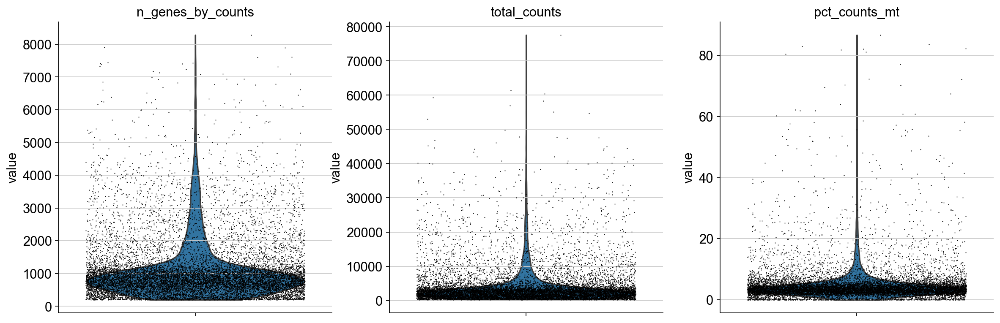

In [10]:
sc.pl.violin(copd_data, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

In [11]:
copd_data = copd_data[copd_data.obs.n_genes_by_counts < 40000, :]
copd_data = copd_data[copd_data.obs.n_genes_by_counts > 500, :]
copd_data = copd_data[copd_data.obs.total_counts > 800, :]
copd_data = copd_data[copd_data.obs.pct_counts_mt < 20, :]
copd_data

View of AnnData object with n_obs × n_vars = 9857 × 20734
    obs: 'cellID', 'sampleID', 'disease', 'dataset', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [12]:
# Clustering
sc.pp.normalize_total(copd_data, target_sum = 1e4)
sc.pp.log1p(copd_data)
sc.pp.highly_variable_genes(copd_data, min_mean = 0.0125, max_mean = 3, min_disp = 0.5, n_top_genes = 1000)
copd_data.raw = copd_data
copd_data = copd_data[:, copd_data.var.highly_variable]
copd_data

normalizing counts per cell
    finished (0:00:00)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


View of AnnData object with n_obs × n_vars = 9857 × 1000
    obs: 'cellID', 'sampleID', 'disease', 'dataset', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'

In [13]:
sc.pp.scale(copd_data, max_value = 10)
sc.tl.pca(copd_data, svd_solver = 'arpack')
sc.pp.neighbors(copd_data, n_neighbors = 15, n_pcs = 40)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:13)


In [15]:
import bbknn
bbknn.bbknn(copd_data, batch_key = "sampleID", n_pcs = 40)

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)


In [17]:
sc.tl.umap(copd_data)
sc.tl.leiden(copd_data, resolution = 0.5)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:15)
running Leiden clustering
    finished: found 19 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:02)


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


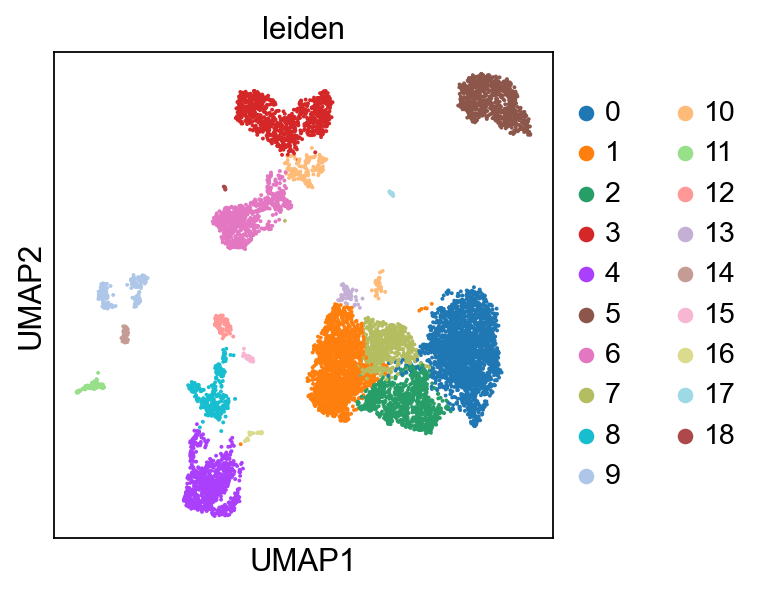

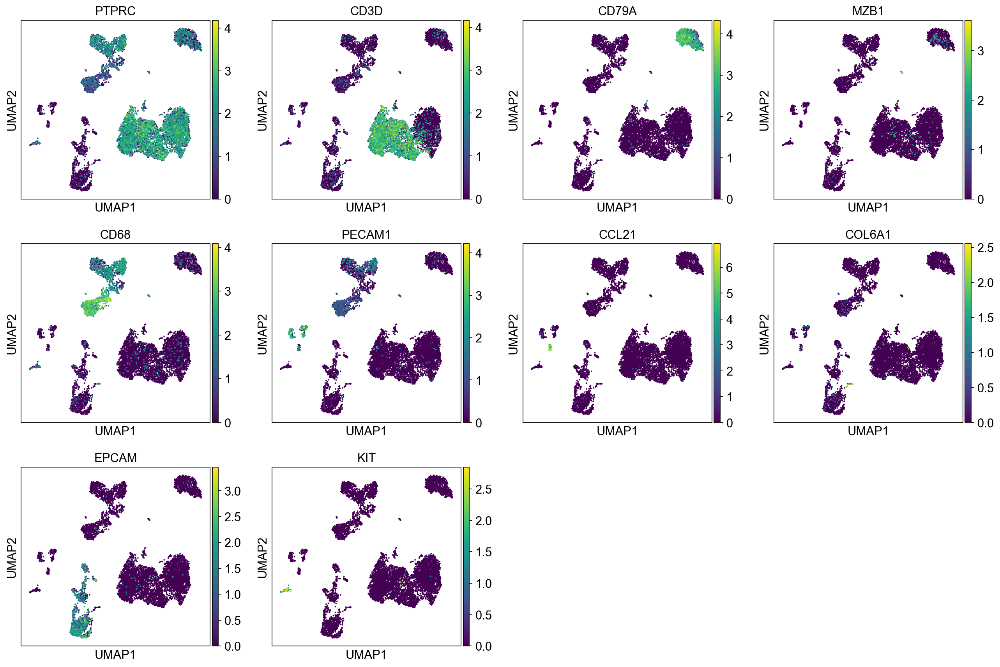

In [18]:
sc.pl.umap(copd_data, color = "leiden")
sc.pl.umap(copd_data, color = ["PTPRC", "CD3D", "CD79A", "MZB1", "CD68",
                               "PECAM1", "CCL21", "COL6A1", "EPCAM", "KIT"])

#### 2.1 GSE168191 (Morrisey2022)

In [66]:
folder_path = "0.RawData/COPD_GSE168191"
sample_list = ["GSM5133588_copd1_periph_rep1.h5",
               "GSM5133589_copd1_periph_rep2.h5",
               "GSM5133590_copd2_periph_rep1.h5",
               "GSM5133591_copd2_periph_rep2.h5",
               "GSM5133592_copd3_periph_rep1.h5",
               "GSM5133593_copd3_periph_rep2.h5",
               "GSM5133594_copd4_periph_rep1.h5"]

In [5]:
count = 0
for sample in sample_list:
    adata = sc.read_10x_h5(folder_path + '/' + sample)
    adata.var_names_make_unique()
    sample_name = str.split(sample, "_")[0]
    adata.obs["cellID"] = [sample_name + '_' + i for i in adata.obs_names.to_list()]
    adata.obs_names = adata.obs["cellID"]
    adata.obs["sampleID"] = sample_name
    adata.obs["disease"] = "COPD"
    adata.obs["histology"] = "COPD"
    adata.obs_names_make_unique()
    if count == 0:
        copd_data = adata
        count = count + 1
    else:
        copd_data = an.concat([copd_data, adata])
copd_data

reading 0.RawData/COPD_GSE168191/GSM5133588_copd1_periph_rep1.h5
 (0:00:00)
reading 0.RawData/COPD_GSE168191/GSM5133589_copd1_periph_rep2.h5


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


 (0:00:00)


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


reading 0.RawData/COPD_GSE168191/GSM5133590_copd2_periph_rep1.h5
 (0:00:01)


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


reading 0.RawData/COPD_GSE168191/GSM5133591_copd2_periph_rep2.h5
 (0:00:01)


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


reading 0.RawData/COPD_GSE168191/GSM5133592_copd3_periph_rep1.h5
 (0:00:01)


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


reading 0.RawData/COPD_GSE168191/GSM5133593_copd3_periph_rep2.h5
 (0:00:00)


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


reading 0.RawData/COPD_GSE168191/GSM5133594_copd4_periph_rep1.h5
 (0:00:01)


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/readwrite.py:239: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = AnnData(


AnnData object with n_obs × n_vars = 75463 × 33514
    obs: 'cellID', 'sampleID', 'disease'

In [5]:
sex_matches = {
    "GSM5133588": "Female",
    "GSM5133589": "Female",
    "GSM5133590": "Female",
    "GSM5133591": "Female",
    "GSM5133592": "Male",
    "GSM5133593": "Male",
    "GSM5133594": "Male",
}
copd_data.obs["sex"] = [sex_matches[i] for i in copd_data.obs["sampleID"].tolist()]
copd_data

AnnData object with n_obs × n_vars = 75463 × 33514
    obs: 'cellID', 'sampleID', 'disease', 'dataset', 'sex'

In [6]:
age_matches = {
    "GSM5133588": 66,
    "GSM5133589": 66,
    "GSM5133590": 69,
    "GSM5133591": 69,
    "GSM5133592": 64,
    "GSM5133593": 64,
    "GSM5133594": 69,
}
copd_data.obs["age"] = [age_matches[i] for i in copd_data.obs["sampleID"].tolist()]
copd_data

AnnData object with n_obs × n_vars = 75463 × 33514
    obs: 'cellID', 'sampleID', 'disease', 'dataset', 'sex', 'age'

In [7]:
smoking_matches = {
    "GSM5133588": "Yes",
    "GSM5133589": "Yes",
    "GSM5133590": "Yes",
    "GSM5133591": "Yes",
    "GSM5133592": "Yes",
    "GSM5133593": "Yes",
    "GSM5133594": "Yes",
}
copd_data.obs["smoking_status"] = [smoking_matches[i] for i in copd_data.obs["sampleID"].tolist()]
copd_data

AnnData object with n_obs × n_vars = 75463 × 33514
    obs: 'cellID', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status'

In [12]:
copd_data.obs["dataset"] = "Morrisey_2022"
copd_data.obs["method"] = "10x"
copd_data.write(folder_path + "/Morrisey_2022.h5ad")
copd_data

AnnData object with n_obs × n_vars = 75463 × 33514
    obs: 'cellID', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'method', 'histology'

In [67]:
# QC
copd_data = sc.read_h5ad(folder_path + "/Morrisey_2022.h5ad")
copd_data.var["mt"] = copd_data.var_names.str.startswith('MT-') # annotate the group of mitochondrial genes
sc.pp.filter_cells(copd_data, min_genes=200)
sc.pp.filter_genes(copd_data, min_cells=3)
sc.pp.calculate_qc_metrics(copd_data, qc_vars = ['mt'], percent_top = None, log1p = False, inplace = True)

filtered out 1832 cells that have less than 200 genes expressed
filtered out 7302 genes that are detected in less than 3 cells


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


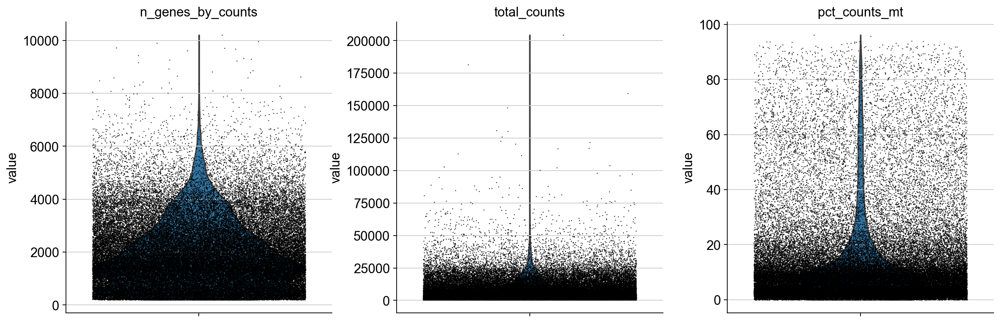

In [11]:
sc.pl.violin(copd_data, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

In [68]:
copd_data = copd_data[copd_data.obs.n_genes_by_counts < 40000, :]
copd_data = copd_data[copd_data.obs.n_genes_by_counts > 500, :]
copd_data = copd_data[copd_data.obs.total_counts > 800, :]
copd_data = copd_data[copd_data.obs.pct_counts_mt < 20, :]
copd_data

View of AnnData object with n_obs × n_vars = 58185 × 26212
    obs: 'cellID', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'method', 'histology', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [69]:
copd_data_counts = copd_data
copd_data_counts

View of AnnData object with n_obs × n_vars = 58185 × 26212
    obs: 'cellID', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'method', 'histology', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [80]:
# Clustering
copd_data.layers["counts"] = copd_data.X.copy()
sc.pp.normalize_total(copd_data, target_sum = 1e4)
sc.pp.log1p(copd_data)
sc.pp.highly_variable_genes(copd_data, min_mean = 0.0125, max_mean = 3, min_disp = 0.5, n_top_genes = 1000)
copd_data.raw = copd_data
copd_data = copd_data[:, copd_data.var.highly_variable]
copd_data

normalizing counts per cell
    finished (0:00:00)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


View of AnnData object with n_obs × n_vars = 58185 × 1000
    obs: 'cellID', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'method', 'histology', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
    layers: 'counts'

In [81]:
sc.pp.scale(copd_data, max_value = 10)
sc.tl.pca(copd_data, svd_solver = 'arpack')
sc.pp.neighbors(copd_data, n_neighbors = 15, n_pcs = 40)

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:03)
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:07)


In [82]:
import bbknn
bbknn.bbknn(copd_data, batch_key = "sampleID", n_pcs = 40)

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:09)


In [83]:
sc.tl.umap(copd_data)
sc.tl.leiden(copd_data, resolution = 0.5)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:57)
running Leiden clustering
    finished: found 21 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:40)


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


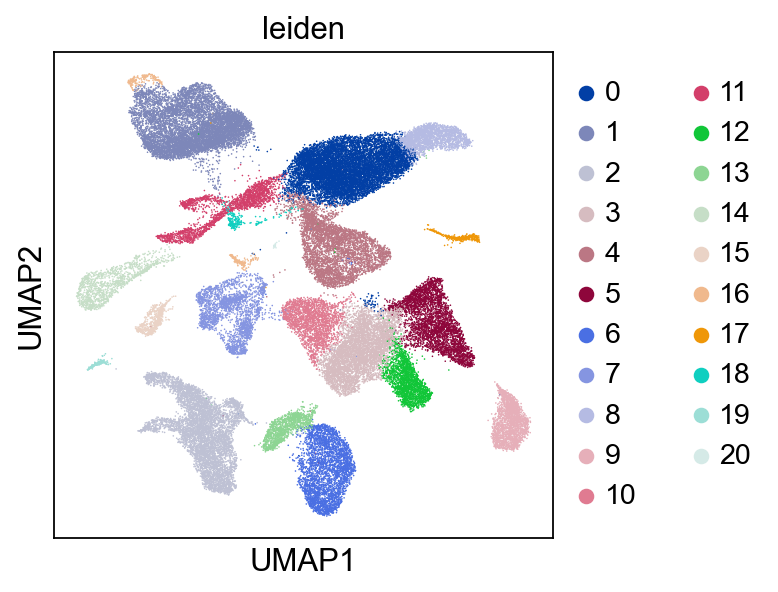

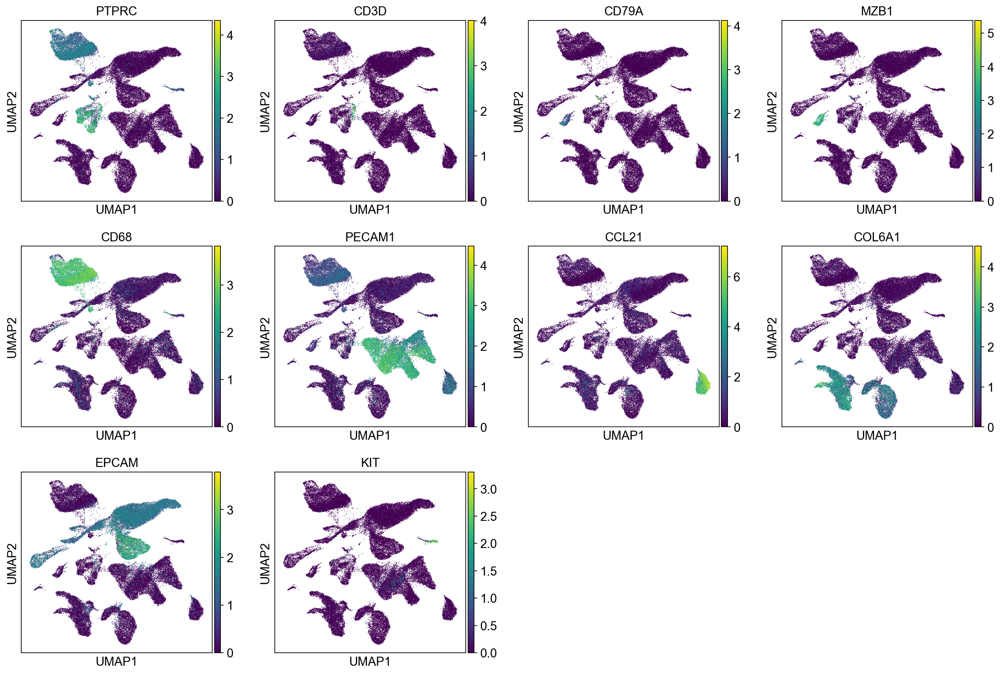

In [84]:
sc.pl.umap(copd_data, color = "leiden")
sc.pl.umap(copd_data, color = ["PTPRC", "CD3D", "CD79A", "MZB1", "CD68",
                               "PECAM1", "CCL21", "COL6A1", "EPCAM", "KIT"])

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


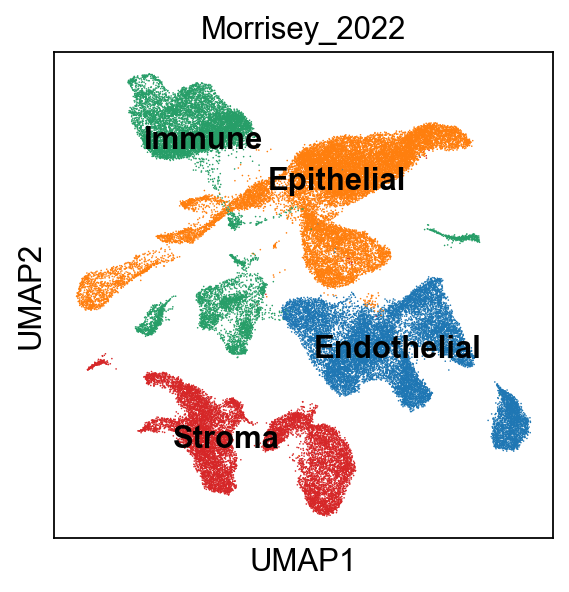

In [86]:
new_cluster_names = {
    "0": "Epithelial",
    "1": "Immune",
    "2": "Stroma",
    "3": "Endothelial",
    "4": "Epithelial",
    "5": "Endothelial",
    "6": "Stroma",
    "7": "Immune",
    "8": "Epithelial",
    "9": "Endothelial",
    "10": "Endothelial",
    "11": "Epithelial",
    "12": "Endothelial",
    "13": "Stroma",
    "14": "Epithelial",
    "15": "Immune",
    "16": "Immune",
    "17": "Immune",
    "18": "Immune",
    "19": "Stroma",
    "20": "Epithelial"
}
copd_data.obs["major_cell_type"] = [new_cluster_names[i] for i in copd_data.obs["leiden"].tolist()]
sc.pl.umap(copd_data, color = ["major_cell_type"], legend_loc = "on data", title = "Morrisey_2022")

In [87]:
copd_data.write("1.ProcessedData/copd_Morrisey_2022.h5ad")
copd_data

AnnData object with n_obs × n_vars = 58185 × 1000
    obs: 'cellID', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'method', 'histology', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'major_cell_type'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'major_cell_type_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [71]:
# Save raw counts file
copd_data_counts.obs = copd_data.obs
copd_data_counts

AnnData object with n_obs × n_vars = 58185 × 26212
    obs: 'cellID', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'method', 'histology', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'major_cell_type'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [72]:
copd_data_counts.write("1.ProcessedData/copd_Morrisey_2022_counts.h5ad")
copd_data_counts

AnnData object with n_obs × n_vars = 58185 × 26212
    obs: 'cellID', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'method', 'histology', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'major_cell_type'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

#### 2.2 GSE173896 (Yamamoto2022)

In [19]:
folder_path = "0.RawData/COPD_GSE173896"
sample_list = ["GSM5282538_JK05_",
               "GSM5282539_JK07_",
               "GSM5282540_JK08_",
               "GSM5282541_JK09_",
               "GSM5282542_JK10_"]

In [24]:
count = 0
for sample in sample_list:
    adata = sc.read_10x_mtx(folder_path, 
                            var_names = "gene_symbols", cache = True, prefix = sample)
    adata.var_names_make_unique()
    sample_name = str.split(sample, "_")[0]
    adata.obs["cellID"] = [sample_name + '_' + i for i in adata.obs_names.to_list()]
    adata.obs_names = adata.obs["cellID"]
    adata.obs["sampleID"] = sample_name
    adata.obs["disease"] = "COPD"
    adata.obs_names_make_unique()
    if count == 0:
        copd_data = adata
        count = count + 1
    else:
        copd_data = an.concat([copd_data, adata])
copd_data

... reading from cache file cache/0.RawData-COPD_GSE173896-GSM5282538_JK05_matrix.h5ad
... reading from cache file cache/0.RawData-COPD_GSE173896-GSM5282539_JK07_matrix.h5ad
... reading from cache file cache/0.RawData-COPD_GSE173896-GSM5282540_JK08_matrix.h5ad
... reading from cache file cache/0.RawData-COPD_GSE173896-GSM5282541_JK09_matrix.h5ad
... reading from cache file cache/0.RawData-COPD_GSE173896-GSM5282542_JK10_matrix.h5ad


AnnData object with n_obs × n_vars = 16432 × 33538
    obs: 'cellID', 'sampleID', 'disease'

In [28]:
sex_matches = {
    "GSM5282538": "Female",
    "GSM5282539": "Male",
    "GSM5282540": "Male",
    "GSM5282541": "Male",
    "GSM5282542": "Male",
}
copd_data.obs["sex"] = [sex_matches[i] for i in copd_data.obs["sampleID"].tolist()]
copd_data

AnnData object with n_obs × n_vars = 16432 × 33538
    obs: 'cellID', 'sampleID', 'disease', 'dataset', 'sex'

In [29]:
age_matches = {
    "GSM5282538": 67,
    "GSM5282539": 81,
    "GSM5282540": 77,
    "GSM5282541": 72,
    "GSM5282542": 76,
}
copd_data.obs["age"] = [age_matches[i] for i in copd_data.obs["sampleID"].tolist()]
copd_data

AnnData object with n_obs × n_vars = 16432 × 33538
    obs: 'cellID', 'sampleID', 'disease', 'dataset', 'sex', 'age'

In [10]:
copd_data.obs["smoking_status"] = "Yes"
copd_data

AnnData object with n_obs × n_vars = 16432 × 33538
    obs: 'cellID', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'method', 'histology', 'smoking_status'

In [11]:
copd_data.obs["dataset"] = "Yamamoto_2022"
copd_data.obs["method"] = "10x"
copd_data.write(folder_path + "/Yamamoto_2022.h5ad")
copd_data

AnnData object with n_obs × n_vars = 16432 × 33538
    obs: 'cellID', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'method', 'histology', 'smoking_status'

In [20]:
# QC
copd_data = sc.read_h5ad(folder_path + "/Yamamoto_2022.h5ad")
copd_data.var["mt"] = copd_data.var_names.str.startswith('MT-') # annotate the group of mitochondrial genes
sc.pp.filter_cells(copd_data, min_genes=200)
sc.pp.filter_genes(copd_data, min_cells=3)
sc.pp.calculate_qc_metrics(copd_data, qc_vars = ['mt'], percent_top = None, log1p = False, inplace = True)

filtered out 863 cells that have less than 200 genes expressed
filtered out 8814 genes that are detected in less than 3 cells


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


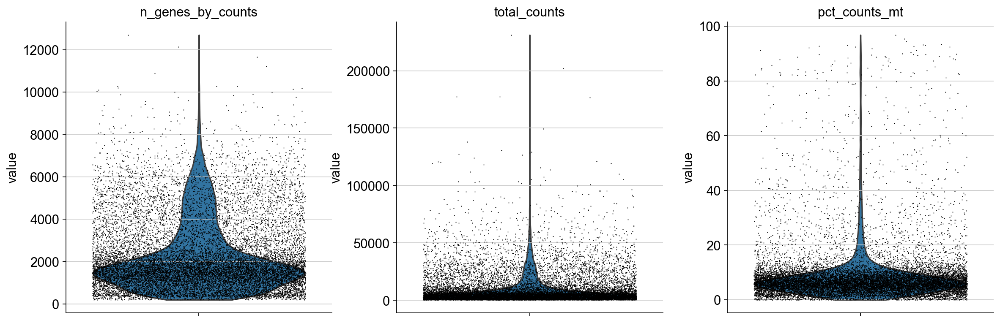

In [21]:
sc.pl.violin(copd_data, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

In [22]:
copd_data = copd_data[copd_data.obs.n_genes_by_counts < 40000, :]
copd_data = copd_data[copd_data.obs.n_genes_by_counts > 500, :]
copd_data = copd_data[copd_data.obs.total_counts > 800, :]
copd_data = copd_data[copd_data.obs.pct_counts_mt < 20, :]
copd_data

View of AnnData object with n_obs × n_vars = 13757 × 24724
    obs: 'cellID', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'method', 'histology', 'smoking_status', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [23]:
copd_data_counts = copd_data
copd_data_counts

View of AnnData object with n_obs × n_vars = 13757 × 24724
    obs: 'cellID', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'method', 'histology', 'smoking_status', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [92]:
# Clustering
copd_data.layers["counts"] = copd_data.X.copy()
sc.pp.normalize_total(copd_data, target_sum = 1e4)
sc.pp.log1p(copd_data)
sc.pp.highly_variable_genes(copd_data, min_mean = 0.0125, max_mean = 3, min_disp = 0.5, n_top_genes = 1000)
copd_data.raw = copd_data
copd_data = copd_data[:, copd_data.var.highly_variable]
copd_data

normalizing counts per cell
    finished (0:00:00)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


View of AnnData object with n_obs × n_vars = 13757 × 1000
    obs: 'cellID', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'method', 'histology', 'smoking_status', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
    layers: 'counts'

In [93]:
sc.pp.scale(copd_data, max_value = 10)
sc.tl.pca(copd_data, svd_solver = 'arpack')
sc.pp.neighbors(copd_data, n_neighbors = 15, n_pcs = 40)

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)


In [94]:
import bbknn
bbknn.bbknn(copd_data, batch_key = "sampleID", n_pcs = 40)

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)


In [95]:
sc.tl.umap(copd_data)
sc.tl.leiden(copd_data, resolution = 0.3)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)
running Leiden clustering
    finished: found 17 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:02)


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


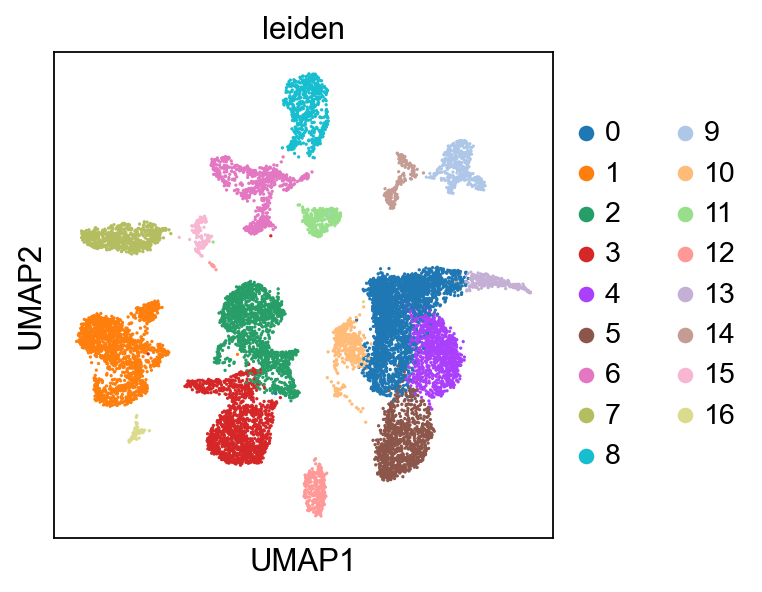

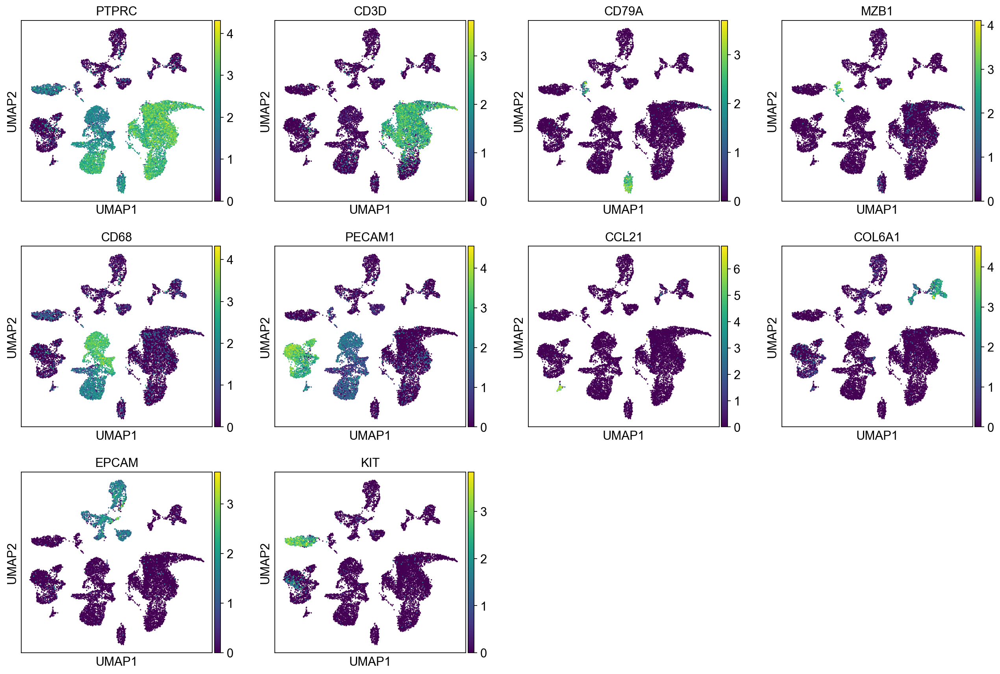

In [96]:
sc.pl.umap(copd_data, color = "leiden")
sc.pl.umap(copd_data, color = ["PTPRC", "CD3D", "CD79A", "MZB1", "CD68",
                               "PECAM1", "CCL21", "COL6A1", "EPCAM", "KIT"])

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


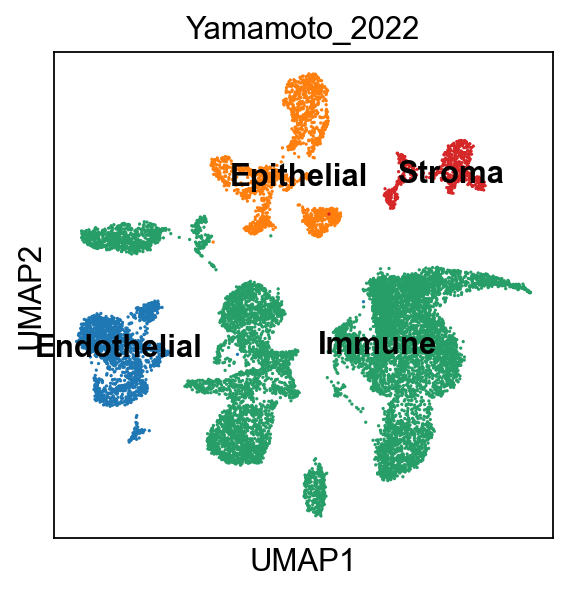

In [97]:
new_cluster_names = {
    "0": "Immune",
    "1": "Endothelial",
    "2": "Immune",
    "3": "Immune",
    "4": "Immune",
    "5": "Immune",
    "6": "Epithelial",
    "7": "Immune",
    "8": "Epithelial",
    "9": "Stroma",
    "10": "Immune",
    "11": "Epithelial",
    "12": "Immune",
    "13": "Immune",
    "14": "Stroma",
    "15": "Immune",
    "16": "Endothelial"
}
copd_data.obs["major_cell_type"] = [new_cluster_names[i] for i in copd_data.obs["leiden"].tolist()]
sc.pl.umap(copd_data, color = ["major_cell_type"], legend_loc = "on data", title = "Yamamoto_2022")

In [98]:
copd_data.write("1.ProcessedData/copd_Yamamoto_2022.h5ad")
copd_data

AnnData object with n_obs × n_vars = 13757 × 1000
    obs: 'cellID', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'method', 'histology', 'smoking_status', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'major_cell_type'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'major_cell_type_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [25]:
# Save counts file
copd_data_counts.obs = copd_data.obs
copd_data_counts

AnnData object with n_obs × n_vars = 13757 × 24724
    obs: 'cellID', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'method', 'histology', 'smoking_status', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'major_cell_type'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [26]:
copd_data_counts.write_h5ad("1.ProcessedData/copd_Yamamoto_2022_counts.h5ad")
copd_data_counts

AnnData object with n_obs × n_vars = 13757 × 24724
    obs: 'cellID', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'method', 'histology', 'smoking_status', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'major_cell_type'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

### 3. Other Cancer samples

#### 3.1 GSE131907 (Lee2020)

In [27]:
folder_path = "0.RawData/Cancer_GSE131907"

In [35]:
matrix = pd.read_csv(folder_path + "/GSE131907_Lung_Cancer_raw_UMI_matrix.txt", sep = "\t")
matrix.index = matrix["Index"].tolist()
del matrix["Index"]
matrix = matrix.T
matrix

,A1BG,A1BG-AS1,A1CF,A2M,A2M-AS1,A2ML1,A2ML1-AS1,A2ML1-AS2,A4GALT,A4GNT,...,ZXDA,ZXDB,ZXDC,ZYG11A,ZYG11B,ZYX,ZZEF1,ZZZ3,bP-21264C1.2,bP-2189O9.3
AAACCTGAGAAACCGC_LN_05,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AAACCTGAGAAACGCC_NS_13,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
AAACCTGAGAAGGTGA_LUNG_N18,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AAACCTGAGACAAAGG_LUNG_N18,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AAACCTGAGACATAAC_LN_04,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCATCTTGCCGT_LUNG_T30,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
TTTGTCATCTTGTATC_EFFUSION_13,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
TTTGTCATCTTTACAC_LUNG_N20,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
TTTGTCATCTTTACAC_LUNG_T25,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [38]:
meta = pd.read_csv(folder_path + "/GSE131907_Lung_Cancer_cell_annotation.txt.gz", sep = "\t")
meta.index = meta["Index"].tolist()
meta = meta.loc[matrix.index.tolist(),:]
meta

,Index,Barcode,Sample,Sample_Origin,Cell_type,Cell_type.refined,Cell_subtype
AAACCTGAGAAACCGC_LN_05,AAACCTGAGAAACCGC_LN_05,AAACCTGAGAAACCGC,LN_05,nLN,B lymphocytes,B lymphocytes,MALT B cells
AAACCTGAGAAACGCC_NS_13,AAACCTGAGAAACGCC_NS_13,AAACCTGAGAAACGCC,NS_13,mBrain,Epithelial cells,Epithelial cells,Malignant cells
AAACCTGAGAAGGTGA_LUNG_N18,AAACCTGAGAAGGTGA_LUNG_N18,AAACCTGAGAAGGTGA,LUNG_N18,nLung,T lymphocytes,T/NK cells,CD4+ Th
AAACCTGAGACAAAGG_LUNG_N18,AAACCTGAGACAAAGG_LUNG_N18,AAACCTGAGACAAAGG,LUNG_N18,nLung,Myeloid cells,Myeloid cells,Monocytes
AAACCTGAGACATAAC_LN_04,AAACCTGAGACATAAC_LN_04,AAACCTGAGACATAAC,LN_04,nLN,T lymphocytes,T/NK cells,Naive CD4+ T
...,...,...,...,...,...,...,...
TTTGTCATCTTGCCGT_LUNG_T30,TTTGTCATCTTGCCGT_LUNG_T30,TTTGTCATCTTGCCGT,LUNG_T30,tLung,Epithelial cells,Epithelial cells,tS1
TTTGTCATCTTGTATC_EFFUSION_13,TTTGTCATCTTGTATC_EFFUSION_13,TTTGTCATCTTGTATC,EFFUSION_13,PE,T lymphocytes,T/NK cells,Naive CD4+ T
TTTGTCATCTTTACAC_LUNG_N20,TTTGTCATCTTTACAC_LUNG_N20,TTTGTCATCTTTACAC,LUNG_N20,nLung,MAST cells,MAST cells,MAST
TTTGTCATCTTTACAC_LUNG_T25,TTTGTCATCTTTACAC_LUNG_T25,TTTGTCATCTTTACAC,LUNG_T25,tLung,B lymphocytes,B lymphocytes,Follicular B cells


In [39]:
adata = an.AnnData(X = matrix)
adata

/tmp/ipykernel_71006/2979402035.py:1: FutureWarning: X.dtype being converted to np.float32 from int64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = an.AnnData(X = matrix)


AnnData object with n_obs × n_vars = 208506 × 29634

In [40]:
for column in meta.columns.tolist():
    adata.obs[column] = meta[column].tolist()
adata

AnnData object with n_obs × n_vars = 208506 × 29634
    obs: 'Index', 'Barcode', 'Sample', 'Sample_Origin', 'Cell_type', 'Cell_type.refined', 'Cell_subtype'

In [49]:
adata.write_h5ad(folder_path + "/Lee2020_raw.h5ad")
adata

AnnData object with n_obs × n_vars = 208506 × 29634
    obs: 'Index', 'Barcode', 'Sample', 'Sample_Origin', 'Cell_type', 'Cell_type.refined', 'Cell_subtype'

In [56]:
# Filtering
cancer_data = sc.read_h5ad(folder_path + "/Lee2020_raw.h5ad")
set(cancer_data.obs["Sample_Origin"])

{'PE', 'mBrain', 'mLN', 'nLN', 'nLung', 'tL/B', 'tLung'}

In [57]:
cancer_data = cancer_data[cancer_data.obs["Sample_Origin"] == "tLung"]
del cancer_data.obs["Sample_Origin"]
del cancer_data.obs["Barcode"]
del cancer_data.obs["Cell_type"]
del cancer_data.obs["Cell_type.refined"]
del cancer_data.obs["Cell_subtype"]
cancer_data.obs["disease"] = "cancer"
cancer_data.obs["histology"] = "LUAD"
cancer_data.obs.columns = ["cellID", "sampleID", "disease", "histology"]
cancer_data

/tmp/ipykernel_69692/3523499462.py:7: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  cancer_data.obs["disease"] = "cancer"


AnnData object with n_obs × n_vars = 45149 × 29634
    obs: 'cellID', 'sampleID', 'disease', 'histology'

In [58]:
smoking_matches = {
    "LUNG_T06": "Yes",
    "LUNG_T08": "No",
    "LUNG_T09": "Yes",
    "LUNG_T18": "Yes",
    "LUNG_T19": "Yes",
    "LUNG_T20": "Yes",
    "LUNG_T25": "Yes",
    "LUNG_T28": "Yes",
    "LUNG_T30": "No",
    "LUNG_T31": "Yes",
    "LUNG_T34": "No",
}
cancer_data.obs["smoking_status"] = [smoking_matches[i] for i in cancer_data.obs["sampleID"].tolist()]
cancer_data.obs["sex"] = np.nan
cancer_data.obs["age"] = np.nan
cancer_data

AnnData object with n_obs × n_vars = 45149 × 29634
    obs: 'cellID', 'sampleID', 'disease', 'histology', 'smoking_status', 'sex', 'age'

In [59]:
cancer_data.obs["dataset"] = "Lee_2020"
cancer_data.obs["method"] = "10x"
cancer_data.write_h5ad(folder_path + "/Lee2020.h5ad")
cancer_data

AnnData object with n_obs × n_vars = 45149 × 29634
    obs: 'cellID', 'sampleID', 'disease', 'histology', 'smoking_status', 'sex', 'age', 'dataset', 'method'

In [28]:
# QC
cancer_data = sc.read_h5ad(folder_path + "/Lee2020.h5ad")
cancer_data.var["mt"] = cancer_data.var_names.str.startswith('MT-') # annotate the group of mitochondrial genes
sc.pp.filter_cells(cancer_data, min_genes=200)
sc.pp.filter_genes(cancer_data, min_cells=3)
sc.pp.calculate_qc_metrics(cancer_data, qc_vars = ['mt'], percent_top = None, log1p = False, inplace = True)

filtered out 5313 genes that are detected in less than 3 cells


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


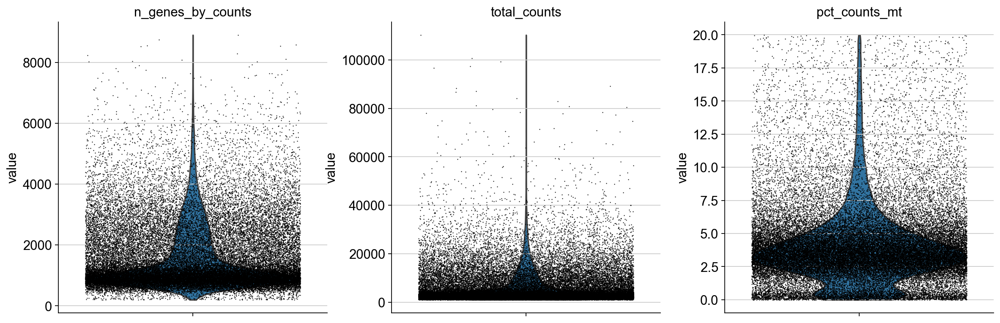

In [29]:
sc.pl.violin(cancer_data, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

In [30]:
cancer_data = cancer_data[cancer_data.obs.n_genes_by_counts < 40000, :]
cancer_data = cancer_data[cancer_data.obs.n_genes_by_counts > 500, :]
cancer_data = cancer_data[cancer_data.obs.total_counts > 800, :]
cancer_data = cancer_data[cancer_data.obs.pct_counts_mt < 20, :]
cancer_data

View of AnnData object with n_obs × n_vars = 44196 × 24321
    obs: 'cellID', 'sampleID', 'disease', 'histology', 'smoking_status', 'sex', 'age', 'dataset', 'method', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [31]:
cancer_data_counts = cancer_data
cancer_data_counts

View of AnnData object with n_obs × n_vars = 44196 × 24321
    obs: 'cellID', 'sampleID', 'disease', 'histology', 'smoking_status', 'sex', 'age', 'dataset', 'method', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [103]:
# Clustering
cancer_data.layers["counts"] = cancer_data.X.copy()
sc.pp.normalize_total(cancer_data, target_sum = 1e4)
sc.pp.log1p(cancer_data)
sc.pp.highly_variable_genes(cancer_data, min_mean = 0.0125, max_mean = 3, min_disp = 0.5, n_top_genes = 1000)
cancer_data.raw = cancer_data
cancer_data = cancer_data[:, cancer_data.var.highly_variable]
cancer_data

normalizing counts per cell
    finished (0:00:00)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:07)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


View of AnnData object with n_obs × n_vars = 44196 × 1000
    obs: 'cellID', 'sampleID', 'disease', 'histology', 'smoking_status', 'sex', 'age', 'dataset', 'method', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
    layers: 'counts'

In [104]:
sc.pp.scale(cancer_data, max_value = 10)
sc.tl.pca(cancer_data, svd_solver = 'arpack')
sc.pp.neighbors(cancer_data, n_neighbors = 15, n_pcs = 40)

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:05)


In [105]:
import bbknn
bbknn.bbknn(cancer_data, batch_key = "sampleID", n_pcs = 40)

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:09)


In [106]:
sc.tl.umap(cancer_data)
sc.tl.leiden(cancer_data, resolution = 0.3)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:49)
running Leiden clustering
    finished: found 14 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:35)


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


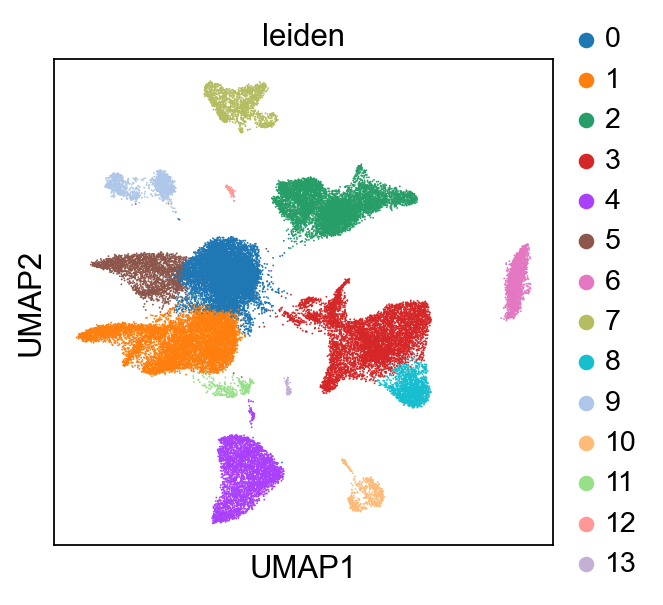

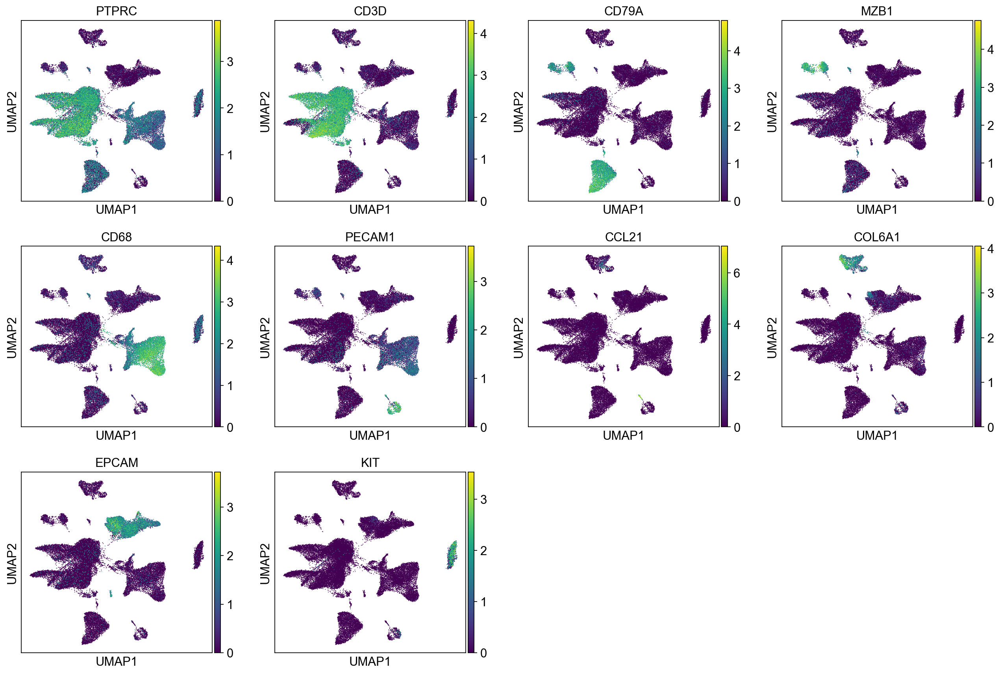

In [107]:
sc.pl.umap(cancer_data, color = "leiden")
sc.pl.umap(cancer_data, color = ["PTPRC", "CD3D", "CD79A", "MZB1", "CD68",
                               "PECAM1", "CCL21", "COL6A1", "EPCAM", "KIT"])

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


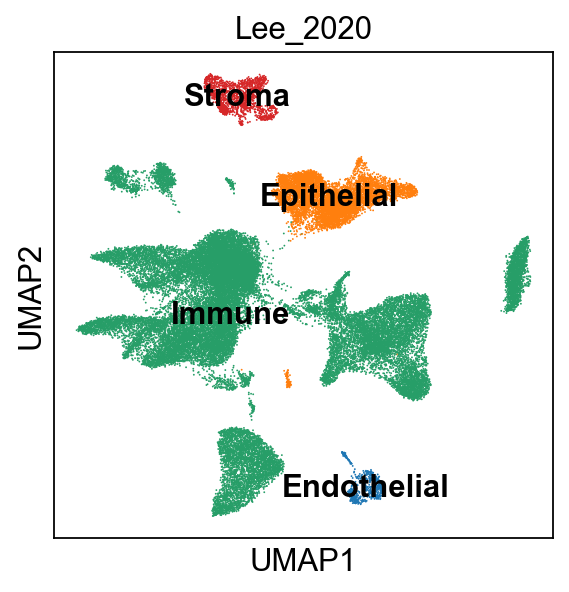

In [110]:
new_cluster_names = {
    "0": "Immune",
    "1": "Immune",
    "2": "Epithelial",
    "3": "Immune",
    "4": "Immune",
    "5": "Immune",
    "6": "Immune",
    "7": "Stroma",
    "8": "Immune",
    "9": "Immune",
    "10": "Endothelial",
    "11": "Immune",
    "12": "Immune",
    "13": "Epithelial",
}
cancer_data.obs["major_cell_type"] = [new_cluster_names[i] for i in cancer_data.obs["leiden"].tolist()]
sc.pl.umap(cancer_data, color = ["major_cell_type"], legend_loc = "on data", title = "Lee_2020")

In [111]:
cancer_data.write_h5ad("1.ProcessedData/cancer_Lee_2020.h5ad")
cancer_data

AnnData object with n_obs × n_vars = 44196 × 1000
    obs: 'cellID', 'sampleID', 'disease', 'histology', 'smoking_status', 'sex', 'age', 'dataset', 'method', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'major_cell_type'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'major_cell_type_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [33]:
# Save counts file
cancer_data_counts.obs = cancer_data.obs
cancer_data_counts

AnnData object with n_obs × n_vars = 44196 × 24321
    obs: 'cellID', 'sampleID', 'disease', 'histology', 'smoking_status', 'sex', 'age', 'dataset', 'method', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'major_cell_type'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [34]:
cancer_data_counts.write_h5ad("1.ProcessedData/cancer_Lee_2020_counts.h5ad")
cancer_data_counts

AnnData object with n_obs × n_vars = 44196 × 24321
    obs: 'cellID', 'sampleID', 'disease', 'histology', 'smoking_status', 'sex', 'age', 'dataset', 'method', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'major_cell_type'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

#### 3.2 GSE136246 (Levantini2021, inDrops)

In [35]:
folder_path = "0.RawData/Cancer_GSE136246"
file_list = os.listdir(folder_path)
files = [i for i in file_list if i.find("NSC") != -1]
files

['GSM4043260_NSC040.counts.tsv.gz',
 'GSM4043240_NSC004.t4.counts.tsv.gz',
 'GSM4043250_NSC016.t3.counts.tsv.gz',
 'GSM4043251_NSC019.t1.counts.tsv.gz',
 'GSM4043246_NSC015.t2.counts.tsv.gz',
 'GSM4043259_NSC037.counts.tsv.gz',
 'GSM4043243_NSC010.t1.counts.tsv.gz',
 'GSM4043249_NSC016.t2.counts.tsv.gz',
 'GSM4043255_NSC021.t1.counts.tsv.gz',
 'GSM4043237_NSC004.t1.counts.tsv.gz',
 'GSM4043254_NSC020.t2.counts.tsv.gz',
 'GSM4043247_NSC015.t3.counts.tsv.gz',
 'GSM4043248_NSC016.t1.counts.tsv.gz',
 'GSM4043241_NSC009.t1.counts.tsv.gz',
 'GSM4043258_NSC036.counts.tsv.gz',
 'GSM4043253_NSC020.t1.counts.tsv.gz',
 'GSM4043242_NSC009.t2.counts.tsv.gz',
 'GSM4043257_NSC035.counts.tsv.gz',
 'GSM4043238_NSC004.t2.counts.tsv.gz',
 'GSM4043244_NSC010.t2.counts.tsv.gz',
 'GSM4043256_NSC021.t2.counts.tsv.gz',
 'GSM4043245_NSC015.t1.counts.tsv.gz',
 'GSM4043252_NSC019.t2.counts.tsv.gz',
 'GSM4043239_NSC004.t3.counts.tsv.gz']

In [9]:
count = 0
for sample in files:
    data = pd.read_csv(folder_path + "/" +sample, sep = "\t")
    data.index = data["barcode"].tolist()
    del data["barcode"]
    bdata = an.AnnData(X = data)
    bdata.obs_names = [sample.split("_")[0] + i for i in data.index.tolist()]
    bdata.obs["cellID"] = bdata.obs_names.tolist()
    bdata.obs["patientID"] = sample.split("_")[1].split(".")[0]
    bdata.obs["sampleID"] = sample.split("_")[0]
    bdata.obs["disease"] = "cancer"
    bdata.obs_names_make_unique()
    if count == 0:
        adata = bdata
        count = count + 1
    else:
        adata = an.concat([adata,bdata])
adata

/tmp/ipykernel_12739/2070663094.py:6: FutureWarning: X.dtype being converted to np.float32 from int64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  bdata = an.AnnData(X = data)
/tmp/ipykernel_12739/2070663094.py:6: FutureWarning: X.dtype being converted to np.float32 from int64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  bdata = an.AnnData(X = data)
/tmp/ipykernel_12739/2070663094.py:6: FutureWarning: X.dtype being converted to np.float32 from int64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  bdata = an.AnnData(X = data)
/tmp/ipykernel_12739/2070663094.py:6: FutureWarning:

AnnData object with n_obs × n_vars = 105887 × 41861
    obs: 'cellID', 'patientID', 'sampleID', 'disease'

In [10]:
adata = adata[adata.obs["patientID"] != "NSC015"]
adata

View of AnnData object with n_obs × n_vars = 98391 × 41861
    obs: 'cellID', 'patientID', 'sampleID', 'disease'

In [12]:
histology_matches = {
 'NSC004':'LUSC',
 'NSC009':"LUSC",
 'NSC010':'LUAD',
 'NSC016':'LUAD',
 'NSC019':'LUAD',
 'NSC020':'LUAD',
 'NSC021':'LUAD',
 'NSC035':'LUAD',
 'NSC036':'LUAD',
 'NSC037':'LUAD',
 'NSC040':'LUAD'
}
adata.obs["histology"] = [histology_matches[i] for i in adata.obs["patientID"].tolist()]
adata

/tmp/ipykernel_12739/1080978027.py:14: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["histology"] = [histology_matches[i] for i in adata.obs["patientID"].tolist()]


AnnData object with n_obs × n_vars = 98391 × 41861
    obs: 'cellID', 'patientID', 'sampleID', 'disease', 'histology'

In [14]:
sex_matches = {
 'NSC004':'Male',
 'NSC009':"Female",
 'NSC010':'Male',
 'NSC016':'Female',
 'NSC019':'Female',
 'NSC020':'Male',
 'NSC021':'Female',
 'NSC035':'Male',
 'NSC036':'Female',
 'NSC037':'Female',
 'NSC040':'Female'
}
adata.obs["sex"] = [sex_matches[i] for i in adata.obs["patientID"].tolist()]
adata

AnnData object with n_obs × n_vars = 98391 × 41861
    obs: 'cellID', 'patientID', 'sampleID', 'disease', 'histology', 'sex'

In [77]:
age_matches = {
 'NSC004': 79,
 'NSC009': 74,
 'NSC010': 73,
 'NSC016': 61,
 'NSC019': 72,
 'NSC020': 76,
 'NSC021': 63,
 'NSC035': 73,
 'NSC036': 80,
 'NSC037': 48,
 'NSC040': 56
}
adata.obs["age"] = [age_matches[i] for i in adata.obs["patientID"].tolist()]
adata

AnnData object with n_obs × n_vars = 98391 × 41861
    obs: 'cellID', 'patientID', 'sampleID', 'disease', 'histology', 'sex', 'age'

In [78]:
smoking_matches = {
 'NSC004': "Yes",
 'NSC009': "Yes",
 'NSC010': "Yes",
 'NSC016': "No",
 'NSC019': "Yes",
 'NSC020': "Yes",
 'NSC021': "Yes",
 'NSC035': "No",
 'NSC036': "Yes",
 'NSC037': "No",
 'NSC040': "Yes",
}
adata.obs["smoking_status"] = [smoking_matches[i] for i in adata.obs["patientID"].tolist()]
adata

AnnData object with n_obs × n_vars = 98391 × 41861
    obs: 'cellID', 'patientID', 'sampleID', 'disease', 'histology', 'sex', 'age', 'smoking_status'

In [20]:
adata.obs["dataset"] = "Levantini_2021"
adata.obs["method"] = "inDrops"
adata.write_h5ad(folder_path + "/Levantini2021.h5ad")
adata

AnnData object with n_obs × n_vars = 98391 × 41861
    obs: 'cellID', 'patientID', 'sampleID', 'disease', 'histology', 'sex', 'age', 'smoking_status', 'dataset', 'method'

In [39]:
# QC
cancer_data = sc.read_h5ad(folder_path + "/Levantini2021.h5ad")
cancer_data
cancer_data.var["mt"] = cancer_data.var_names.str.startswith('MT-') # annotate the group of mitochondrial genes
sc.pp.filter_cells(cancer_data, min_genes=200)
sc.pp.filter_genes(cancer_data, min_cells=3)
sc.pp.calculate_qc_metrics(cancer_data, qc_vars = ['mt'], percent_top = None, log1p = False, inplace = True)

filtered out 32474 cells that have less than 200 genes expressed
filtered out 1629 genes that are detected in less than 3 cells


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


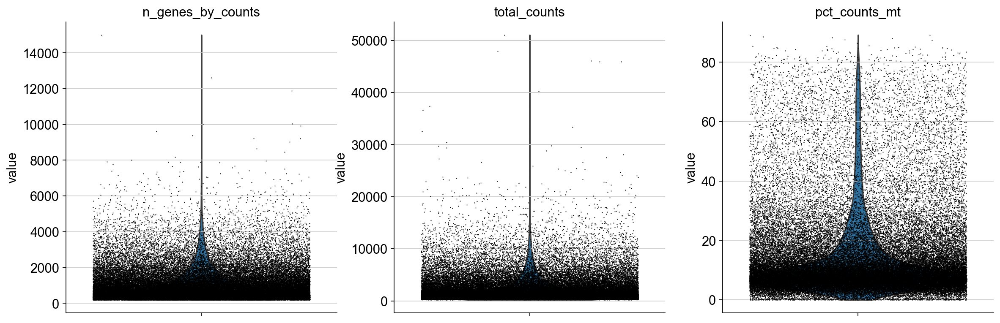

In [115]:
sc.pl.violin(cancer_data, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

In [40]:
cancer_data = cancer_data[cancer_data.obs.n_genes_by_counts < 40000, :]
cancer_data = cancer_data[cancer_data.obs.n_genes_by_counts > 500, :]
cancer_data = cancer_data[cancer_data.obs.total_counts > 800, :]
cancer_data = cancer_data[cancer_data.obs.pct_counts_mt < 20, :]
cancer_data

View of AnnData object with n_obs × n_vars = 34145 × 40232
    obs: 'cellID', 'patientID', 'sampleID', 'disease', 'histology', 'sex', 'age', 'smoking_status', 'dataset', 'method', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [41]:
cancer_data_counts = cancer_data
cancer_data_counts

View of AnnData object with n_obs × n_vars = 34145 × 40232
    obs: 'cellID', 'patientID', 'sampleID', 'disease', 'histology', 'sex', 'age', 'smoking_status', 'dataset', 'method', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [117]:
# Clustering
cancer_data.layers["counts"] = cancer_data.X.copy()
sc.pp.normalize_total(cancer_data, target_sum = 1e4)
sc.pp.log1p(cancer_data)
sc.pp.highly_variable_genes(cancer_data, min_mean = 0.0125, max_mean = 3, min_disp = 0.5, n_top_genes = 1000)
cancer_data.raw = cancer_data
cancer_data = cancer_data[:, cancer_data.var.highly_variable]
cancer_data

normalizing counts per cell
    finished (0:00:00)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:10)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


View of AnnData object with n_obs × n_vars = 34145 × 1000
    obs: 'cellID', 'patientID', 'sampleID', 'disease', 'histology', 'sex', 'age', 'smoking_status', 'dataset', 'method', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
    layers: 'counts'

In [118]:
sc.pp.scale(cancer_data, max_value = 10)
sc.tl.pca(cancer_data, svd_solver = 'arpack')
sc.pp.neighbors(cancer_data, n_neighbors = 15, n_pcs = 40)

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)


In [119]:
import bbknn
bbknn.bbknn(cancer_data, batch_key = "sampleID", n_pcs = 40)

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:12)


In [120]:
sc.tl.umap(cancer_data)
sc.tl.leiden(cancer_data, resolution = 0.3)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:45)
running Leiden clustering
    finished: found 19 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:01:02)


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


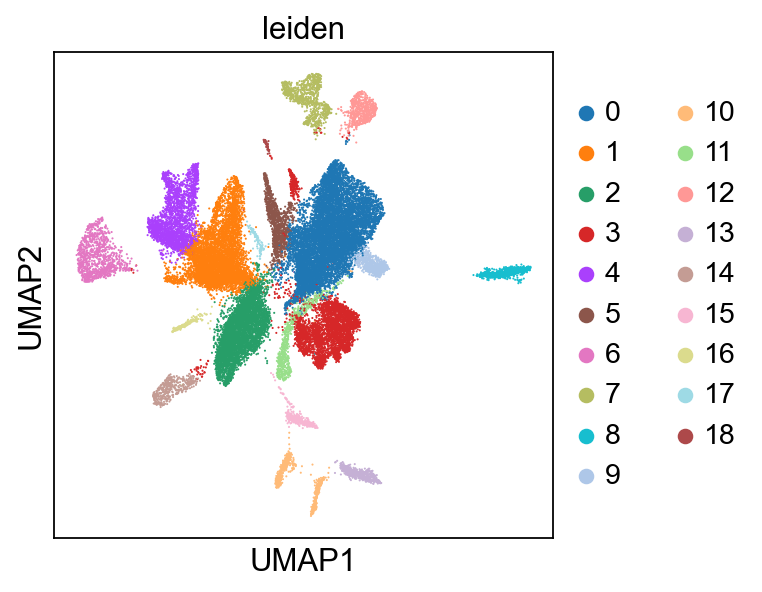

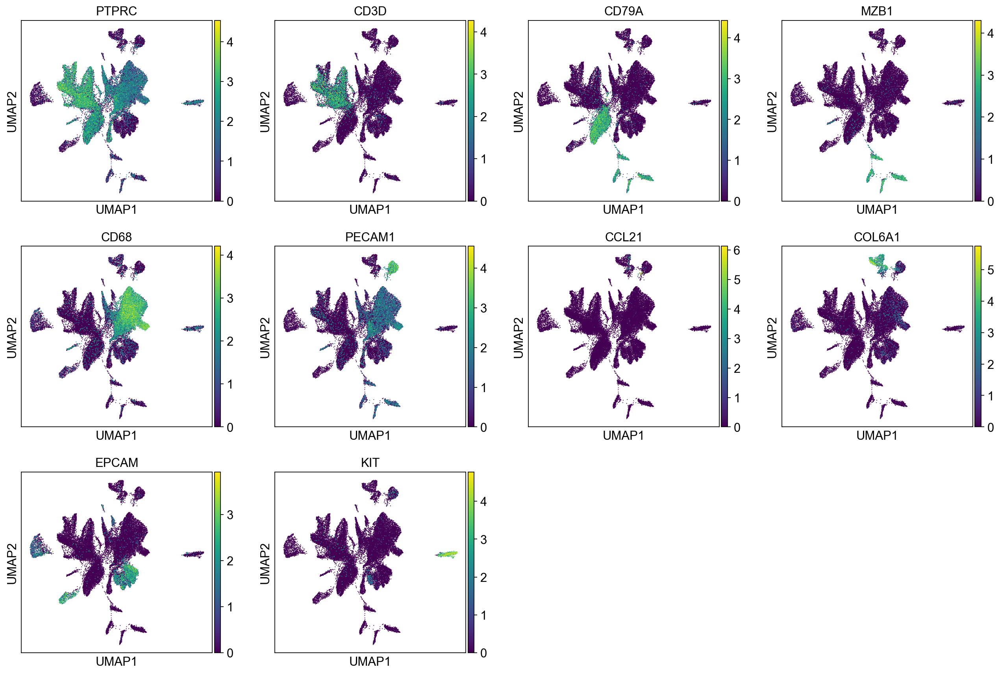

In [121]:
sc.pl.umap(cancer_data, color = "leiden")
sc.pl.umap(cancer_data, color = ["PTPRC", "CD3D", "CD79A", "MZB1", "CD68",
                               "PECAM1", "CCL21", "COL6A1", "EPCAM", "KIT"])

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


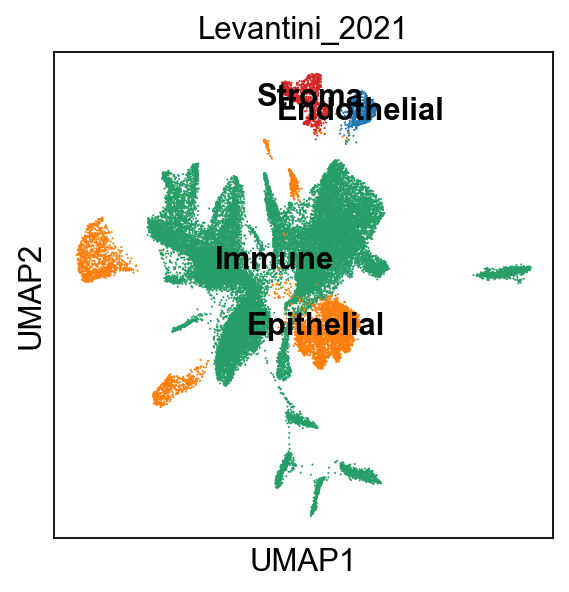

In [126]:
new_cluster_names = {
    "0": "Immune",
    "1": "Immune",
    "2": "Immune",
    "3": "Epithelial",
    "4": "Immune",
    "5": "Immune",
    "6": "Epithelial",
    "7": "Stroma",
    "8": "Immune",
    "9": "Immune",
    "10": "Immune",
    "11": "Immune",
    "12": "Endothelial",
    "13": "Immune", 
    "14": "Epithelial",
    "15": "Immune",
    "16": "Immune",
    "17": "Immune",
    "18": "Epithelial",
}
cancer_data.obs["major_cell_type"] = [new_cluster_names[i] for i in cancer_data.obs["leiden"].tolist()]
sc.pl.umap(cancer_data, color = ["major_cell_type"], legend_loc = "on data", title = "Levantini_2021")

In [127]:
cancer_data.write_h5ad("1.ProcessedData/cancer_Levantini_2021.h5ad")
cancer_data

AnnData object with n_obs × n_vars = 34145 × 1000
    obs: 'cellID', 'patientID', 'sampleID', 'disease', 'histology', 'sex', 'age', 'smoking_status', 'dataset', 'method', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'major_cell_type'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'major_cell_type_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [43]:
cancer_data_counts.obs = cancer_data.obs
cancer_data_counts

AnnData object with n_obs × n_vars = 34145 × 40232
    obs: 'cellID', 'patientID', 'sampleID', 'disease', 'histology', 'sex', 'age', 'smoking_status', 'dataset', 'method', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'major_cell_type'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [44]:
cancer_data_counts.write_h5ad("1.ProcessedData/cancer_Levantini_2021_counts.h5ad")
cancer_data_counts

AnnData object with n_obs × n_vars = 34145 × 40232
    obs: 'cellID', 'patientID', 'sampleID', 'disease', 'histology', 'sex', 'age', 'smoking_status', 'dataset', 'method', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'major_cell_type'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

#### 3.3 GSE127465 (Klein2019, inDrops)

In [3]:
folder_path = "0.RawData/Cancer_GSE127465"
file_list = os.listdir(folder_path)
files = [i for i in file_list if i.startswith("GSM")]
files

['GSM3635300_human_p6b1_raw_counts.tsv.gz',
 'GSM3635298_human_p6t1_raw_counts.tsv.gz',
 'GSM3635294_human_p4t3_raw_counts.tsv.gz',
 'GSM3635280_human_p1t3_raw_counts.tsv.gz',
 'GSM3635291_human_p3b1_raw_counts.tsv.gz',
 'GSM3635289_human_p3t2_raw_counts.tsv.gz',
 'GSM3635296_human_p5t1_raw_counts.tsv.gz',
 'GSM3635279_human_p1t2_raw_counts.tsv.gz',
 'GSM3635302_human_p7t2_raw_counts.tsv.gz',
 'GSM3635292_human_p4t1_raw_counts.tsv.gz',
 'GSM3635287_human_p2b1_raw_counts.tsv.gz',
 'GSM3635283_human_p1b2_raw_counts.tsv.gz',
 'GSM3635285_human_p2t1_raw_counts.tsv.gz',
 'GSM3635281_human_p1t4_raw_counts.tsv.gz',
 'GSM3635290_human_p3t3_raw_counts.tsv.gz',
 'GSM3635282_human_p1b1_raw_counts.tsv.gz',
 'GSM3635293_human_p4t2_raw_counts.tsv.gz',
 'GSM3635278_human_p1t1_raw_counts.tsv.gz',
 'GSM3635297_human_p5t2_raw_counts.tsv.gz',
 'GSM3635288_human_p3t1_raw_counts.tsv.gz',
 'GSM3635286_human_p2t2_raw_counts.tsv.gz',
 'GSM3635303_human_p7b1_raw_counts.tsv.gz',
 'GSM3635299_human_p6t2_raw_coun

In [9]:
count = 0
for file in files:
    print(file)
    data = pd.read_csv(folder_path + "/" + file, sep = "\t")
    data.index = [file.split("_")[0] + "_" + i for i in data["barcode"].tolist()]
    data["patientID"] = file.split("_")[2][:2]
    data["tissue"] = file.split("_")[2][2]
    data["sampleID"] = file.split("_")[2]
    del data["barcode"]
    if count == 0:
        df = data
        count = count + 1
    else:
        df = pd.concat([df,data])
df

GSM3635300_human_p6b1_raw_counts.tsv.gz
GSM3635298_human_p6t1_raw_counts.tsv.gz
GSM3635294_human_p4t3_raw_counts.tsv.gz
GSM3635280_human_p1t3_raw_counts.tsv.gz
GSM3635291_human_p3b1_raw_counts.tsv.gz
GSM3635289_human_p3t2_raw_counts.tsv.gz
GSM3635296_human_p5t1_raw_counts.tsv.gz
GSM3635279_human_p1t2_raw_counts.tsv.gz
GSM3635302_human_p7t2_raw_counts.tsv.gz
GSM3635292_human_p4t1_raw_counts.tsv.gz
GSM3635287_human_p2b1_raw_counts.tsv.gz
GSM3635283_human_p1b2_raw_counts.tsv.gz
GSM3635285_human_p2t1_raw_counts.tsv.gz
GSM3635281_human_p1t4_raw_counts.tsv.gz
GSM3635290_human_p3t3_raw_counts.tsv.gz
GSM3635282_human_p1b1_raw_counts.tsv.gz
GSM3635293_human_p4t2_raw_counts.tsv.gz
GSM3635278_human_p1t1_raw_counts.tsv.gz
GSM3635297_human_p5t2_raw_counts.tsv.gz
GSM3635288_human_p3t1_raw_counts.tsv.gz
GSM3635286_human_p2t2_raw_counts.tsv.gz
GSM3635303_human_p7b1_raw_counts.tsv.gz
GSM3635299_human_p6t2_raw_counts.tsv.gz
GSM3635284_human_p1b3_raw_counts.tsv.gz
GSM3635295_human_p4b1_raw_counts.tsv.gz


,5S_rRNA,5_8S_rRNA,7SK,A1BG,A1BG-AS1,A1CF,A2M,A2M-AS1,A2ML1,A2ML1-AS1,...,snoU83B,snoZ196,snoZ278,snoZ40,snoZ6,snosnR66,uc_338,patientID,tissue,sampleID
GSM3635300_bcDVUE,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,p6,b,p6b1
GSM3635300_bcBEKL,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,p6,b,p6b1
GSM3635300_bcFPDC,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,p6,b,p6b1
GSM3635300_bcACPE,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,p6,b,p6b1
GSM3635300_bcGWHW,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,p6,b,p6b1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GSM3635301_bcFTWU,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,p7,t,p7t1
GSM3635301_bcDDKP,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,p7,t,p7t1
GSM3635301_bcHCUC,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,p7,t,p7t1
GSM3635301_bcDXZN,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,p7,t,p7t1


In [10]:
df["barcode"] = df.index.tolist()
cols = ["barcode","sampleID","patientID","tissue"]
obs = df.loc[:,cols]
obs

,barcode,sampleID,patientID,tissue
GSM3635300_bcDVUE,GSM3635300_bcDVUE,p6b1,p6,b
GSM3635300_bcBEKL,GSM3635300_bcBEKL,p6b1,p6,b
GSM3635300_bcFPDC,GSM3635300_bcFPDC,p6b1,p6,b
GSM3635300_bcACPE,GSM3635300_bcACPE,p6b1,p6,b
GSM3635300_bcGWHW,GSM3635300_bcGWHW,p6b1,p6,b
...,...,...,...,...
GSM3635301_bcFTWU,GSM3635301_bcFTWU,p7t1,p7,t
GSM3635301_bcDDKP,GSM3635301_bcDDKP,p7t1,p7,t
GSM3635301_bcHCUC,GSM3635301_bcHCUC,p7t1,p7,t
GSM3635301_bcDXZN,GSM3635301_bcDXZN,p7t1,p7,t


In [11]:
del df["barcode"]
del df["sampleID"]
del df["patientID"]
del df["tissue"]
df

,5S_rRNA,5_8S_rRNA,7SK,A1BG,A1BG-AS1,A1CF,A2M,A2M-AS1,A2ML1,A2ML1-AS1,...,snoU18,snoU2-30,snoU2_19,snoU83B,snoZ196,snoZ278,snoZ40,snoZ6,snosnR66,uc_338
GSM3635300_bcDVUE,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
GSM3635300_bcBEKL,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
GSM3635300_bcFPDC,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
GSM3635300_bcACPE,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
GSM3635300_bcGWHW,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GSM3635301_bcFTWU,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
GSM3635301_bcDDKP,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
GSM3635301_bcHCUC,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
GSM3635301_bcDXZN,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [12]:
adata = an.AnnData(X = df)
for col in ["barcode","sampleID","patientID","tissue"]:
    adata.obs[col] = obs[col]
adata

/tmp/ipykernel_69519/2830106128.py:1: FutureWarning: X.dtype being converted to np.float32 from int64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = an.AnnData(X = df)


AnnData object with n_obs × n_vars = 173954 × 41861
    obs: 'barcode', 'sampleID', 'patientID', 'tissue'

In [36]:
adata.write_h5ad(folder_path + "/Klein2019_raw.h5ad")
adata

AnnData object with n_obs × n_vars = 173954 × 41861
    obs: 'barcode', 'sampleID', 'patientID', 'tissue'

In [37]:
# Filtering
cancer_data = sc.read_h5ad(folder_path + "/Klein2019_raw.h5ad")
cancer_data

AnnData object with n_obs × n_vars = 173954 × 41861
    obs: 'barcode', 'sampleID', 'patientID', 'tissue'

In [38]:
cancer_data = cancer_data[cancer_data.obs["tissue"] == 't']
del cancer_data.obs["tissue"]
cancer_data.obs["disease"] = "cancer"
cancer_data.obs.columns = ['cellID', 'sampleID', 'patientID', 'disease']
cancer_data

/tmp/ipykernel_39445/2033203473.py:3: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  cancer_data.obs["disease"] = "cancer"


AnnData object with n_obs × n_vars = 121349 × 41861
    obs: 'cellID', 'sampleID', 'patientID', 'disease'

In [40]:
set(cancer_data.obs["patientID"])

{'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7'}

In [39]:
set(cancer_data.obs["sampleID"])

{'p1t1',
 'p1t2',
 'p1t3',
 'p1t4',
 'p2t1',
 'p2t2',
 'p3t1',
 'p3t2',
 'p3t3',
 'p4t1',
 'p4t2',
 'p4t3',
 'p5t1',
 'p5t2',
 'p6t1',
 'p6t2',
 'p7t1',
 'p7t2'}

In [6]:
histology_matches = {
    "p1":"LUSC",
    "p2":"LUSC",
    "p3":"LUAD",
    "p4":"LUAD",
    "p5":"LUAD",
    "p6":"LUAD",
    "p7":"LUAD"
}
cancer_data.obs["histology"] = [histology_matches[i] for i in cancer_data.obs["patientID"].tolist()]
cancer_data

AnnData object with n_obs × n_vars = 121349 × 41861
    obs: 'cellID', 'sampleID', 'patientID', 'disease', 'histology', 'sex', 'age', 'smoking_status', 'dataset', 'method'

In [7]:
sex_matches = {
    "p1":"Male",
    "p2":"Female",
    "p3":"Female",
    "p4":"Male",
    "p5":"Female",
    "p6":"Male",
    "p7":"Female"
}
cancer_data.obs["sex"] = [sex_matches[i] for i in cancer_data.obs["patientID"].tolist()]
cancer_data

AnnData object with n_obs × n_vars = 121349 × 41861
    obs: 'cellID', 'sampleID', 'patientID', 'disease', 'histology', 'sex', 'age', 'smoking_status', 'dataset', 'method'

In [8]:
age_matches = {
    "p1":79,
    "p2":74,
    "p3":61,
    "p4":83,
    "p5":72,
    "p6":76,
    "p7":63,
}
cancer_data.obs["age"] = [age_matches[i] for i in cancer_data.obs["patientID"].tolist()]
cancer_data

AnnData object with n_obs × n_vars = 121349 × 41861
    obs: 'cellID', 'sampleID', 'patientID', 'disease', 'histology', 'sex', 'age', 'smoking_status', 'dataset', 'method'

In [9]:
cancer_data.obs["smoking_status"] = np.nan
cancer_data

AnnData object with n_obs × n_vars = 121349 × 41861
    obs: 'cellID', 'sampleID', 'patientID', 'disease', 'histology', 'sex', 'age', 'smoking_status', 'dataset', 'method'

In [6]:
cancer_data.obs["dataset"] = "Klein_2019"
cancer_data.obs["method"] = "inDrops"
cancer_data

AnnData object with n_obs × n_vars = 121349 × 41861
    obs: 'cellID', 'sampleID', 'patientID', 'disease', 'histology', 'sex', 'age', 'smoking_status', 'dataset', 'method'

In [7]:
cancer_data.write_h5ad(folder_path + "/Klein2019.h5ad")
cancer_data

AnnData object with n_obs × n_vars = 121349 × 41861
    obs: 'cellID', 'sampleID', 'patientID', 'disease', 'histology', 'sex', 'age', 'smoking_status', 'dataset', 'method'

In [46]:
# QC
cancer_data = sc.read_h5ad(folder_path + "/Klein2019.h5ad")
cancer_data.var["mt"] = cancer_data.var_names.str.startswith('MT-') # annotate the group of mitochondrial genes
sc.pp.filter_cells(cancer_data, min_genes=200)
sc.pp.filter_genes(cancer_data, min_cells=3)
sc.pp.calculate_qc_metrics(cancer_data, qc_vars = ['mt'], percent_top = None, log1p = False, inplace = True)

filtered out 76739 cells that have less than 200 genes expressed
filtered out 6172 genes that are detected in less than 3 cells


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


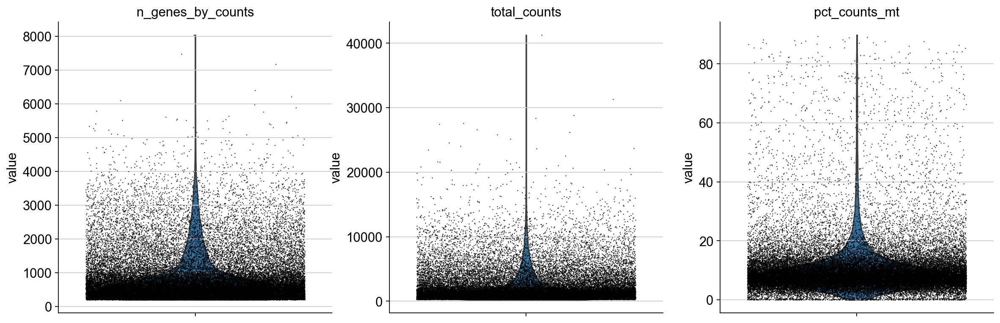

In [130]:
sc.pl.violin(cancer_data, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

In [47]:
cancer_data = cancer_data[cancer_data.obs.n_genes_by_counts < 40000, :]
cancer_data = cancer_data[cancer_data.obs.n_genes_by_counts > 500, :]
cancer_data = cancer_data[cancer_data.obs.total_counts > 800, :]
cancer_data = cancer_data[cancer_data.obs.pct_counts_mt < 20, :]
cancer_data

View of AnnData object with n_obs × n_vars = 24443 × 35689
    obs: 'cellID', 'sampleID', 'patientID', 'disease', 'histology', 'sex', 'age', 'smoking_status', 'dataset', 'method', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [48]:
cancer_data_counts = cancer_data
cancer_data_counts

View of AnnData object with n_obs × n_vars = 24443 × 35689
    obs: 'cellID', 'sampleID', 'patientID', 'disease', 'histology', 'sex', 'age', 'smoking_status', 'dataset', 'method', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [132]:
# Clustering
cancer_data.layers["counts"] = cancer_data.X.copy()
sc.pp.normalize_total(cancer_data, target_sum = 1e4)
sc.pp.log1p(cancer_data)
sc.pp.highly_variable_genes(cancer_data, min_mean = 0.0125, max_mean = 3, min_disp = 0.5, n_top_genes = 1000)
cancer_data.raw = cancer_data
cancer_data = cancer_data[:, cancer_data.var.highly_variable]
cancer_data

normalizing counts per cell
    finished (0:00:00)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:01:13)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


View of AnnData object with n_obs × n_vars = 24443 × 1000
    obs: 'cellID', 'sampleID', 'patientID', 'disease', 'histology', 'sex', 'age', 'smoking_status', 'dataset', 'method', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
    layers: 'counts'

In [133]:
sc.pp.scale(cancer_data, max_value = 10)
sc.tl.pca(cancer_data, svd_solver = 'arpack')
sc.pp.neighbors(cancer_data, n_neighbors = 15, n_pcs = 40)

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)


In [134]:
import bbknn
bbknn.bbknn(cancer_data, batch_key = "sampleID", n_pcs = 40)

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:07)


In [135]:
sc.tl.umap(cancer_data)
sc.tl.leiden(cancer_data, resolution = 0.3)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:31)
running Leiden clustering
    finished: found 14 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:30)


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


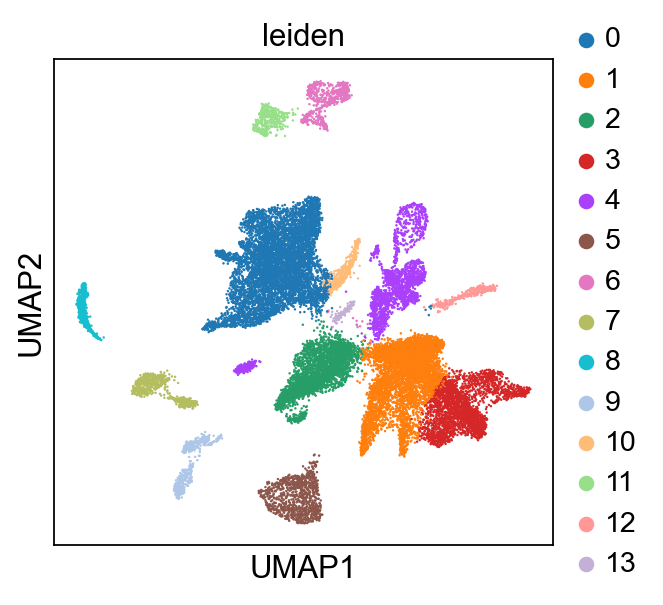

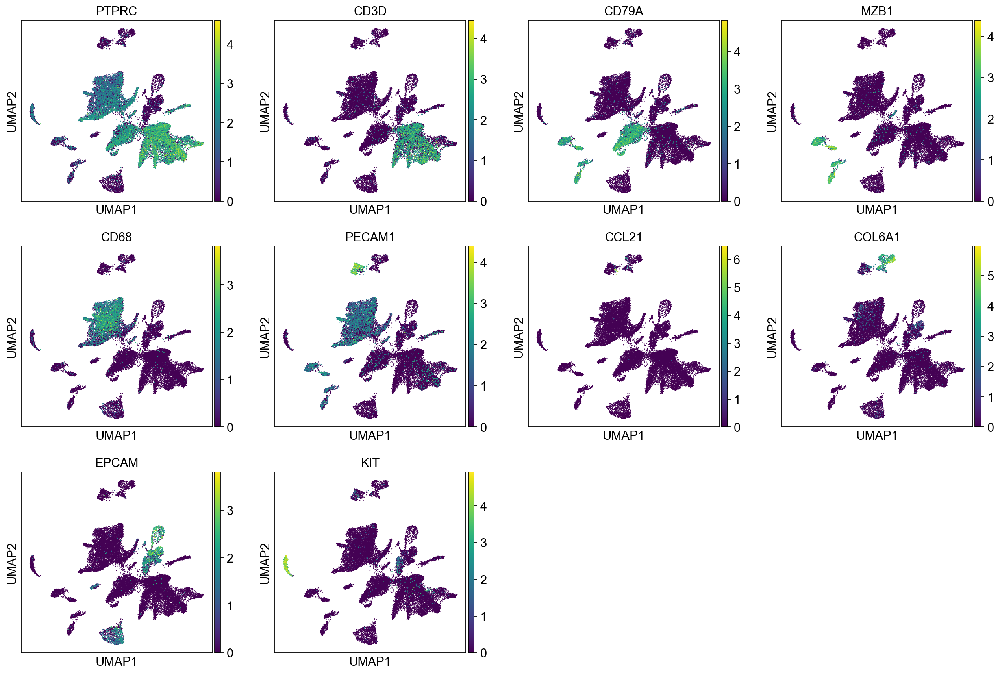

In [136]:
sc.pl.umap(cancer_data, color = "leiden")
sc.pl.umap(cancer_data, color = ["PTPRC", "CD3D", "CD79A", "MZB1", "CD68",
                               "PECAM1", "CCL21", "COL6A1", "EPCAM", "KIT"])

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


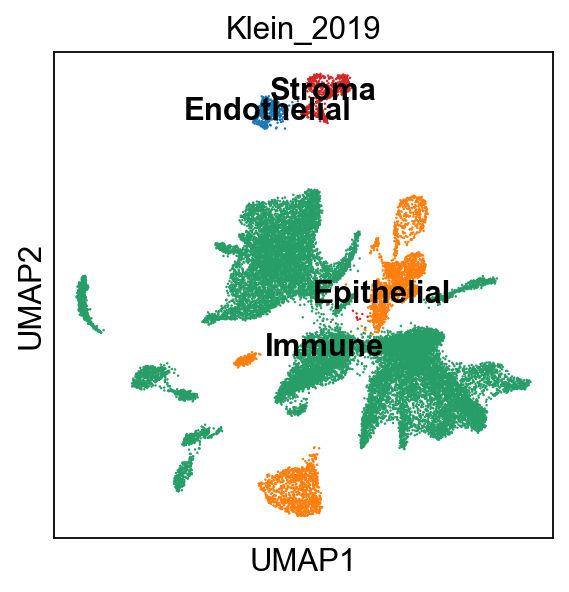

In [138]:
new_cluster_names = {
    "0": "Immune",
    "1": "Immune",
    "2": "Immune",
    "3": "Immune",
    "4": "Epithelial",
    "5": "Epithelial",
    "6": "Stroma",
    "7": "Immune",
    "8": "Immune",
    "9": "Immune",
    "10": "Immune",
    "11": "Endothelial",
    "12": "Immune",
    "13": "Immune", 
}
cancer_data.obs["major_cell_type"] = [new_cluster_names[i] for i in cancer_data.obs["leiden"].tolist()]
sc.pl.umap(cancer_data, color = ["major_cell_type"], legend_loc = "on data", title = "Klein_2019")

In [139]:
cancer_data.write_h5ad("1.ProcessedData/cancer_Klein_2019.h5ad")
cancer_data

AnnData object with n_obs × n_vars = 24443 × 1000
    obs: 'cellID', 'sampleID', 'patientID', 'disease', 'histology', 'sex', 'age', 'smoking_status', 'dataset', 'method', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'major_cell_type'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'major_cell_type_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [12]:
cancer_data = sc.read_h5ad("1.ProcessedData/cancer_Klein_2019.h5ad")
cancer_data

AnnData object with n_obs × n_vars = 24443 × 1000
    obs: 'cellID', 'sampleID', 'patientID', 'disease', 'histology', 'sex', 'age', 'smoking_status', 'dataset', 'method', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'major_cell_type'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'major_cell_type_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [13]:
age_matches = {
    "p1":79,
    "p2":74,
    "p3":61,
    "p4":83,
    "p5":72,
    "p6":76,
    "p7":63,
}
cancer_data.obs["age"] = [age_matches[i] for i in cancer_data.obs["patientID"].tolist()]
cancer_data

AnnData object with n_obs × n_vars = 24443 × 1000
    obs: 'cellID', 'sampleID', 'patientID', 'disease', 'histology', 'sex', 'age', 'smoking_status', 'dataset', 'method', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'major_cell_type'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'major_cell_type_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [14]:
cancer_data.write_h5ad("1.ProcessedData/cancer_Klein_2019.h5ad")
cancer_data

AnnData object with n_obs × n_vars = 24443 × 1000
    obs: 'cellID', 'sampleID', 'patientID', 'disease', 'histology', 'sex', 'age', 'smoking_status', 'dataset', 'method', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'major_cell_type'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'major_cell_type_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [50]:
cancer_data_counts.obs = cancer_data.obs
cancer_data_counts

AnnData object with n_obs × n_vars = 24443 × 35689
    obs: 'cellID', 'sampleID', 'patientID', 'disease', 'histology', 'sex', 'age', 'smoking_status', 'dataset', 'method', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'major_cell_type'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [51]:
cancer_data_counts.write_h5ad("1.ProcessedData/cancer_Klein_2019_counts.h5ad")
cancer_data_counts

AnnData object with n_obs × n_vars = 24443 × 35689
    obs: 'cellID', 'sampleID', 'patientID', 'disease', 'histology', 'sex', 'age', 'smoking_status', 'dataset', 'method', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'major_cell_type'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

#### 3.4 Klauschen2021

In [52]:
folder_path = "0.RawData/Cancer_Klauschen2021"
files = os.listdir(folder_path)
files = [i for i in files if i.startswith("p")]
files

['p034n',
 'p032t',
 'p033n',
 'p024t',
 'p033t',
 'p032n',
 'p023t',
 'p034t',
 'p019t',
 'p031n',
 'p018n',
 'p027t',
 'p030t',
 'p029n',
 'p030n',
 'p027n',
 'p018t',
 'p028n',
 'p031t',
 'p019n']

In [42]:
count = 0
for file in files:
    bdata = sc.read_10x_mtx(folder_path + "/" + file + "/filtered_feature_bc_matrix", var_names='gene_symbols',cache=True) 
    bdata.obs["cellID"] = [file + "_" + i for i in bdata.obs_names.tolist()]
    bdata.obs_names = [file + "_" + i for i in bdata.obs_names.tolist()]
    bdata.obs["sampleID"] = file
    bdata.obs["patientID"] = file[:4]
    bdata.obs["disease"] = "cancer"
    bdata.obs["histology"] = "LUAD"
    bdata.obs["tissue"] = file[4]
    bdata.obs_names_make_unique()
    if count == 0:
        adata = bdata
        count = count + 1
    else:
        adata = an.concat([adata,bdata])
adata

... writing an h5ad cache file to speedup reading next time
... writing an h5ad cache file to speedup reading next time
... writing an h5ad cache file to speedup reading next time
... writing an h5ad cache file to speedup reading next time
... writing an h5ad cache file to speedup reading next time
... writing an h5ad cache file to speedup reading next time
... writing an h5ad cache file to speedup reading next time
... writing an h5ad cache file to speedup reading next time
... writing an h5ad cache file to speedup reading next time
... writing an h5ad cache file to speedup reading next time
... writing an h5ad cache file to speedup reading next time
... writing an h5ad cache file to speedup reading next time
... writing an h5ad cache file to speedup reading next time
... writing an h5ad cache file to speedup reading next time
... writing an h5ad cache file to speedup reading next time
... writing an h5ad cache file to speedup reading next time
... writing an h5ad cache file to speedu

AnnData object with n_obs × n_vars = 133736 × 33538
    obs: 'cellID', 'sampleID', 'patientID', 'histology', 'tissue'

In [19]:
adata = sc.read_h5ad(folder_path + "/Klauschen2021.h5ad")
adata

AnnData object with n_obs × n_vars = 133736 × 33538
    obs: 'cellID', 'sampleID', 'patientID', 'histology', 'tissue'

In [20]:
# Filtering
adata = adata[adata.obs["tissue"] == "t"]
del adata.obs["tissue"]

In [21]:
sex_matches = {
    "p018":"Female",
    "p019":"Male",
    "p023":"Female",
    "p024":"Female",
    "p027":"Male",
    "p030":"Male",
    "p031":"Male",
    "p032":"Female",
    "p033":"Female",
    "p034":"Male"
}
adata.obs["sex"] = [sex_matches[i] for i in adata.obs["patientID"].tolist()]
adata

/tmp/ipykernel_32648/3766161953.py:13: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["sex"] = [sex_matches[i] for i in adata.obs["patientID"].tolist()]


AnnData object with n_obs × n_vars = 73566 × 33538
    obs: 'cellID', 'sampleID', 'patientID', 'histology', 'sex'

In [22]:
age_matches = {
    "p018":58,
    "p019":81,
    "p023":62,
    "p024":63,
    "p027":49,
    "p030":63,
    "p031":77,
    "p032":83,
    "p033":64,
    "p034":63,
}
adata.obs["age"] = [age_matches[i] for i in adata.obs["patientID"].tolist()]
adata

AnnData object with n_obs × n_vars = 73566 × 33538
    obs: 'cellID', 'sampleID', 'patientID', 'histology', 'sex', 'age'

In [23]:
adata.obs["smoking_status"] = np.nan
del adata.obs["patientID"]
adata

AnnData object with n_obs × n_vars = 73566 × 33538
    obs: 'cellID', 'sampleID', 'histology', 'sex', 'age', 'smoking_status'

In [26]:
adata.obs["disease"] = "cancer"
adata.obs["dataset"] = "Klauschen_2021"
adata.obs["method"] = "10x"
adata.write_h5ad(folder_path + "/Klauschen2021.h5ad")

In [53]:
# QC
cancer_data = sc.read_h5ad(folder_path + "/Klauschen2021.h5ad")
cancer_data.var["mt"] = cancer_data.var_names.str.startswith('MT-') # annotate the group of mitochondrial genes
sc.pp.filter_cells(cancer_data, min_genes=200)
sc.pp.filter_genes(cancer_data, min_cells=3)
sc.pp.calculate_qc_metrics(cancer_data, qc_vars = ['mt'], percent_top = None, log1p = False, inplace = True)

filtered out 858 cells that have less than 200 genes expressed
filtered out 6328 genes that are detected in less than 3 cells


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


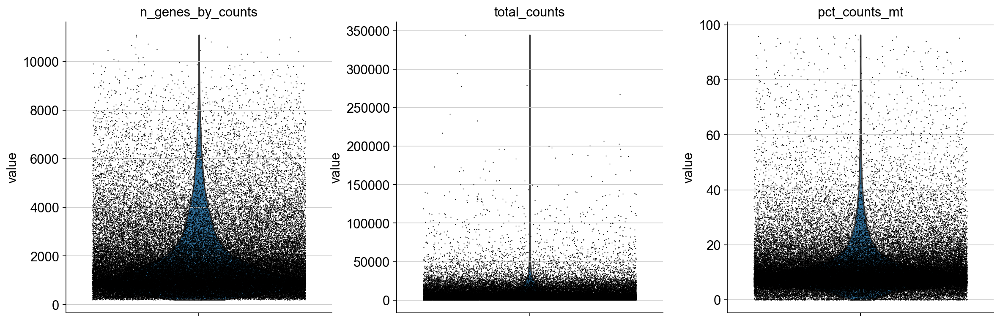

In [143]:
sc.pl.violin(cancer_data, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

In [54]:
cancer_data = cancer_data[cancer_data.obs.n_genes_by_counts < 40000, :]
cancer_data = cancer_data[cancer_data.obs.n_genes_by_counts > 500, :]
cancer_data = cancer_data[cancer_data.obs.total_counts > 800, :]
cancer_data = cancer_data[cancer_data.obs.pct_counts_mt < 20, :]
cancer_data

View of AnnData object with n_obs × n_vars = 59857 × 27210
    obs: 'cellID', 'sampleID', 'histology', 'sex', 'age', 'smoking_status', 'disease', 'dataset', 'method', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [55]:
cancer_data_counts = cancer_data
cancer_data_counts

View of AnnData object with n_obs × n_vars = 59857 × 27210
    obs: 'cellID', 'sampleID', 'histology', 'sex', 'age', 'smoking_status', 'disease', 'dataset', 'method', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [145]:
# Clustering
cancer_data.layers["counts"] = cancer_data.X.copy()
sc.pp.normalize_total(cancer_data, target_sum = 1e4)
sc.pp.log1p(cancer_data)
sc.pp.highly_variable_genes(cancer_data, min_mean = 0.0125, max_mean = 3, min_disp = 0.5, n_top_genes = 1000)
cancer_data.raw = cancer_data
cancer_data = cancer_data[:, cancer_data.var.highly_variable]
cancer_data

normalizing counts per cell
    finished (0:00:00)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


View of AnnData object with n_obs × n_vars = 59857 × 1000
    obs: 'cellID', 'sampleID', 'histology', 'sex', 'age', 'smoking_status', 'disease', 'dataset', 'method', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
    layers: 'counts'

In [146]:
sc.pp.scale(cancer_data, max_value = 10)
sc.tl.pca(cancer_data, svd_solver = 'arpack')
sc.pp.neighbors(cancer_data, n_neighbors = 15, n_pcs = 40)

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:03)
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:06)


In [147]:
import bbknn
bbknn.bbknn(cancer_data, batch_key = "sampleID", n_pcs = 40)

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:11)


In [148]:
sc.tl.umap(cancer_data)
sc.tl.leiden(cancer_data, resolution = 0.3)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:04)
running Leiden clustering
    finished: found 13 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:47)


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


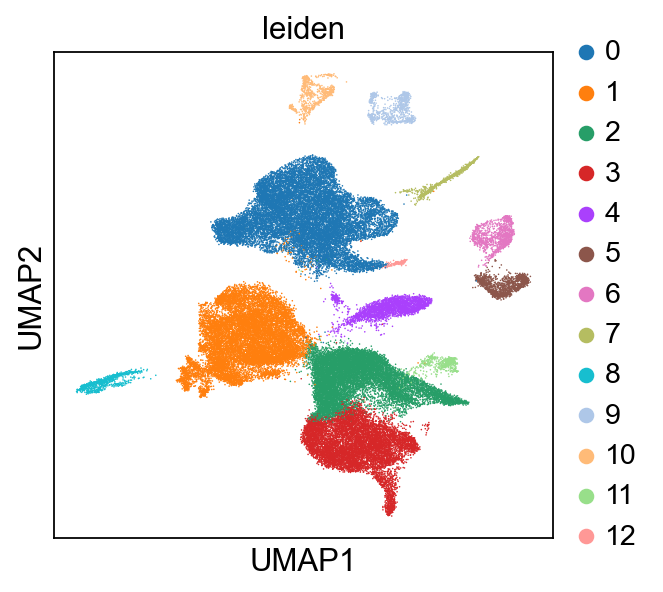

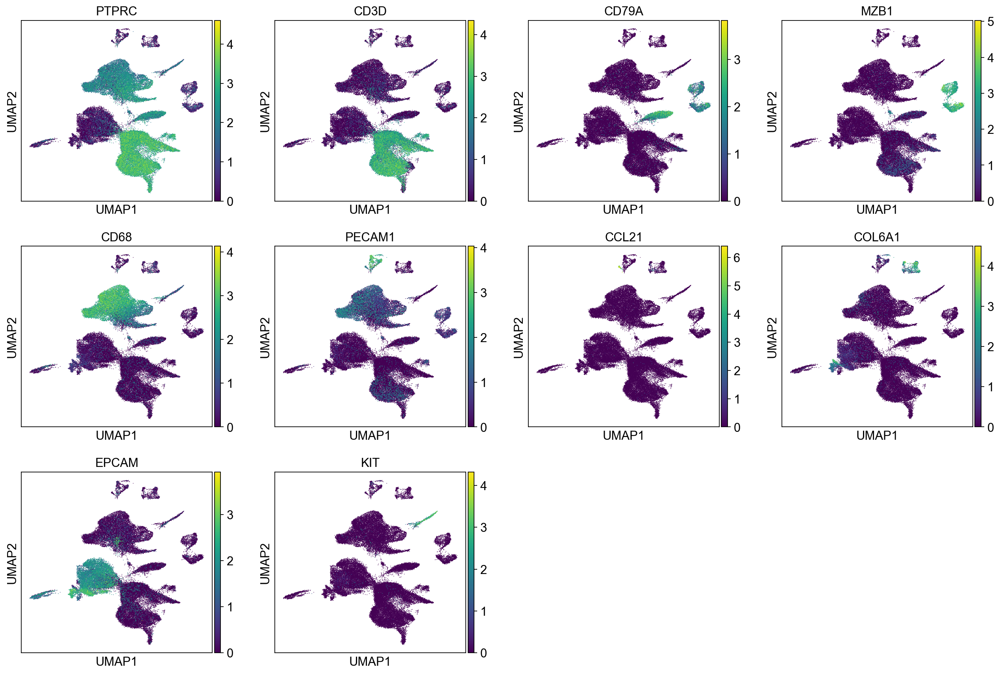

In [149]:
sc.pl.umap(cancer_data, color = "leiden")
sc.pl.umap(cancer_data, color = ["PTPRC", "CD3D", "CD79A", "MZB1", "CD68",
                               "PECAM1", "CCL21", "COL6A1", "EPCAM", "KIT"])

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


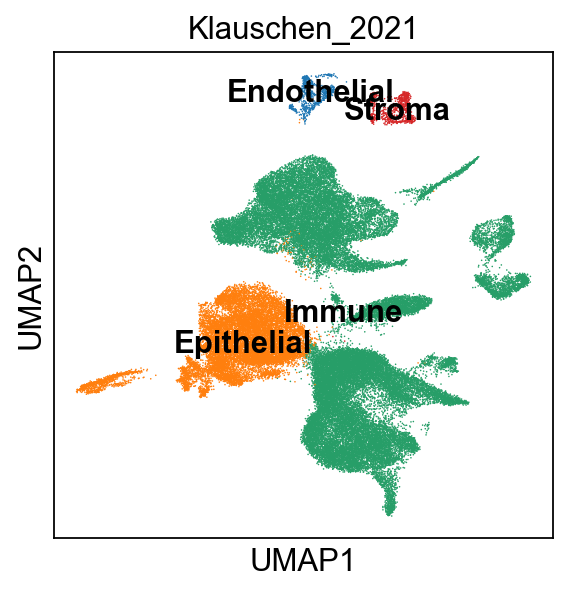

In [150]:
new_cluster_names = {
    "0": "Immune",
    "1": "Epithelial",
    "2": "Immune",
    "3": "Immune",
    "4": "Immune",
    "5": "Immune",
    "6": "Immune",
    "7": "Immune",
    "8": "Epithelial",
    "9": "Stroma",
    "10": "Endothelial",
    "11": "Immune",
    "12": "Immune",
}
cancer_data.obs["major_cell_type"] = [new_cluster_names[i] for i in cancer_data.obs["leiden"].tolist()]
sc.pl.umap(cancer_data, color = ["major_cell_type"], legend_loc = "on data", title = "Klauschen_2021")

In [152]:
cancer_data.write_h5ad("1.ProcessedData/cancer_Klauschen_2021.h5ad")
cancer_data

AnnData object with n_obs × n_vars = 59857 × 1000
    obs: 'cellID', 'sampleID', 'histology', 'sex', 'age', 'smoking_status', 'disease', 'dataset', 'method', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'major_cell_type'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'major_cell_type_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [57]:
cancer_data_counts.obs = cancer_data.obs
cancer_data_counts

AnnData object with n_obs × n_vars = 59857 × 27210
    obs: 'cellID', 'sampleID', 'histology', 'sex', 'age', 'smoking_status', 'disease', 'dataset', 'method', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'major_cell_type'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [58]:
cancer_data_counts.write_h5ad("1.ProcessedData/cancer_Klauschen_2021_counts.h5ad")
cancer_data_counts

AnnData object with n_obs × n_vars = 59857 × 27210
    obs: 'cellID', 'sampleID', 'histology', 'sex', 'age', 'smoking_status', 'disease', 'dataset', 'method', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'major_cell_type'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

#### 3.5 Lambrechts2020

In [59]:
folder_path = "0.RawData/Cancer_Lambrechts2020"

In [60]:
from scipy.io import mmread
matrix = mmread(folder_path + "/Exp_data_UMIcounts.mtx")
matrix = matrix.todense()

In [61]:
cells = pd.read_csv(folder_path + "/Cells.csv")
cells

,cell_name,sample,source,disease,cell_type,subclone,complexity
0,BT1238_AACTTGCTACTCTT,1,core,LUSC,Malignant,1,2266
1,BT1238_AAGCCTGATTCCAT,1,core,LUSC,T_cell,0,2437
2,BT1238_ACAATAACCGATAC,1,core,LUSC,Mast,0,1047
3,BT1238_ACCCTCGATTGGTG,1,core,LUSC,T_cell,0,2067
4,BT1238_ACGAAGCTTGGGAG,1,core,LUSC,Macrophage,0,1087
...,...,...,...,...,...,...,...
27257,scrBT1432_TTTATGCCATTGTGCA,8,core,Pleimorphic,T_cell,0,2365
27258,scrBT1432_TTTCCTCCACTTGGAT,8,core,Pleimorphic,T_cell,0,1185
27259,scrBT1432_TTTCCTCGTTCGGGCT,8,core,Pleimorphic,T_cell,0,1012
27260,scrBT1432_TTTGCGCTCTTCAACT,8,core,Pleimorphic,T_cell,0,1600


In [62]:
genes = pd.read_csv(folder_path + "/Genes.txt", header = None)
genes.columns = ["geneSymbol"]
genes

,geneSymbol
0,FAM138A
1,OR4F5
2,OR4F29
3,OR4F16
4,FAM87B
...,...
22271,PCNT
22272,DIP2A
22273,S100B
22274,PRMT2


In [63]:
metadata = pd.read_csv(folder_path + "/Meta-data.csv")
metadata

,Unnamed: 0,sample,technology,n_cells,patient,cancer_type,sex,age,smoking_status,PY,...,targeted_rx_response,ICB_exposed,ICB_response,ET_exposed,ET_response,time_end_of_rx_to_sampling,post_sampling_rx_exposed,post_sampling_rx_response,PFS_DFS,OS
0,1,1,10x,465,1,NSCLC,F,70-75,NaN,NaN,...,not exposed,not exposed,not exposed,not exposed,not exposed,NaN,NaN,NaN,NaN,NaN
1,2,2,10x,831,2,NSCLC,M,86-90,NaN,NaN,...,not exposed,not exposed,not exposed,not exposed,not exposed,NaN,NaN,NaN,NaN,NaN
2,3,3,10x,3759,3,NSCLC,M,66-70,NaN,NaN,...,not exposed,not exposed,not exposed,not exposed,not exposed,NaN,NaN,NaN,NaN,NaN
3,4,4,10x,4155,4,NSCLC,F,60-65,NaN,NaN,...,not exposed,not exposed,not exposed,not exposed,not exposed,NaN,NaN,NaN,NaN,NaN
4,5,5,10x,4988,5,NSCLC,M,60-65,NaN,NaN,...,not exposed,not exposed,not exposed,not exposed,not exposed,NaN,NaN,NaN,NaN,NaN
5,6,6,10x,1572,6,NSCLC,M,60-65,NaN,NaN,...,not exposed,not exposed,not exposed,not exposed,not exposed,NaN,NaN,NaN,NaN,NaN
6,7,7,10x,6624,7,NSCLC,M,60-65,NaN,NaN,...,not exposed,not exposed,not exposed,not exposed,not exposed,NaN,NaN,NaN,NaN,NaN
7,8,8,10x,4868,8,NSCLC,F,50-55,NaN,NaN,...,not exposed,not exposed,not exposed,not exposed,not exposed,NaN,NaN,NaN,NaN,NaN


In [65]:
cells = cells[["cell_name", "sample", "disease"]]
metadata = metadata[["sample", "technology", "patient", "sex", "age", "smoking_status"]]
obs = pd.merge(cells, metadata, on = "sample")
obs.index = obs["cell_name"].tolist()
obs

,cell_name,sample,disease,technology,patient,sex,age,smoking_status
BT1238_AACTTGCTACTCTT,BT1238_AACTTGCTACTCTT,1,LUSC,10x,1,F,70-75,NaN
BT1238_AAGCCTGATTCCAT,BT1238_AAGCCTGATTCCAT,1,LUSC,10x,1,F,70-75,NaN
BT1238_ACAATAACCGATAC,BT1238_ACAATAACCGATAC,1,LUSC,10x,1,F,70-75,NaN
BT1238_ACCCTCGATTGGTG,BT1238_ACCCTCGATTGGTG,1,LUSC,10x,1,F,70-75,NaN
BT1238_ACGAAGCTTGGGAG,BT1238_ACGAAGCTTGGGAG,1,LUSC,10x,1,F,70-75,NaN
...,...,...,...,...,...,...,...,...
scrBT1432_TTTATGCCATTGTGCA,scrBT1432_TTTATGCCATTGTGCA,8,Pleimorphic,10x,8,F,50-55,NaN
scrBT1432_TTTCCTCCACTTGGAT,scrBT1432_TTTCCTCCACTTGGAT,8,Pleimorphic,10x,8,F,50-55,NaN
scrBT1432_TTTCCTCGTTCGGGCT,scrBT1432_TTTCCTCGTTCGGGCT,8,Pleimorphic,10x,8,F,50-55,NaN
scrBT1432_TTTGCGCTCTTCAACT,scrBT1432_TTTGCGCTCTTCAACT,8,Pleimorphic,10x,8,F,50-55,NaN


In [66]:
adata = an.AnnData(X = matrix.T)
for col in obs.columns.tolist():
    adata.obs[col] = obs[col].tolist()
adata.obs_names = adata.obs["cell_name"].tolist()
adata.var_names = genes["geneSymbol"].tolist()
adata

/tmp/ipykernel_69519/2521802171.py:1: FutureWarning: X.dtype being converted to np.float32 from int64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = an.AnnData(X = matrix.T)


AnnData object with n_obs × n_vars = 27262 × 22276
    obs: 'cell_name', 'sample', 'disease', 'technology', 'patient', 'sex', 'age', 'smoking_status'

In [48]:
adata.obs.columns = ["cellID", "sampleID", "histology", "method", "patientID", "sex", "age", "smoking_status"]
adata.obs

,cellID,sampleID,histology,method,patientID,sex,age,smoking_status
BT1238_AACTTGCTACTCTT,BT1238_AACTTGCTACTCTT,1,LUSC,10x,1,F,70-75,NaN
BT1238_AAGCCTGATTCCAT,BT1238_AAGCCTGATTCCAT,1,LUSC,10x,1,F,70-75,NaN
BT1238_ACAATAACCGATAC,BT1238_ACAATAACCGATAC,1,LUSC,10x,1,F,70-75,NaN
BT1238_ACCCTCGATTGGTG,BT1238_ACCCTCGATTGGTG,1,LUSC,10x,1,F,70-75,NaN
BT1238_ACGAAGCTTGGGAG,BT1238_ACGAAGCTTGGGAG,1,LUSC,10x,1,F,70-75,NaN
...,...,...,...,...,...,...,...,...
scrBT1432_TTTATGCCATTGTGCA,scrBT1432_TTTATGCCATTGTGCA,8,Pleimorphic,10x,8,F,50-55,NaN
scrBT1432_TTTCCTCCACTTGGAT,scrBT1432_TTTCCTCCACTTGGAT,8,Pleimorphic,10x,8,F,50-55,NaN
scrBT1432_TTTCCTCGTTCGGGCT,scrBT1432_TTTCCTCGTTCGGGCT,8,Pleimorphic,10x,8,F,50-55,NaN
scrBT1432_TTTGCGCTCTTCAACT,scrBT1432_TTTGCGCTCTTCAACT,8,Pleimorphic,10x,8,F,50-55,NaN


In [54]:
adata.obs["disease"] = "cancer"
adata.obs["dataset"] = "Lambrechts_2020"
del adata.obs["patientID"]
adata

AnnData object with n_obs × n_vars = 27262 × 22276
    obs: 'cellID', 'sampleID', 'histology', 'method', 'sex', 'age', 'smoking_status', 'disease', 'dataset'

In [55]:
adata.write_h5ad(folder_path + "/Lambrechts2020.h5ad")
adata

AnnData object with n_obs × n_vars = 27262 × 22276
    obs: 'cellID', 'sampleID', 'histology', 'method', 'sex', 'age', 'smoking_status', 'disease', 'dataset'

In [60]:
# QC
cancer_data = sc.read_h5ad(folder_path + "/Lambrechts2020.h5ad")
cancer_data.var["mt"] = cancer_data.var_names.str.startswith('MT-') # annotate the group of mitochondrial genes
sc.pp.filter_cells(cancer_data, min_genes=200)
sc.pp.filter_genes(cancer_data, min_cells=3)
sc.pp.calculate_qc_metrics(cancer_data, qc_vars = ['mt'], percent_top = None, log1p = False, inplace = True)

filtered out 3237 genes that are detected in less than 3 cells


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


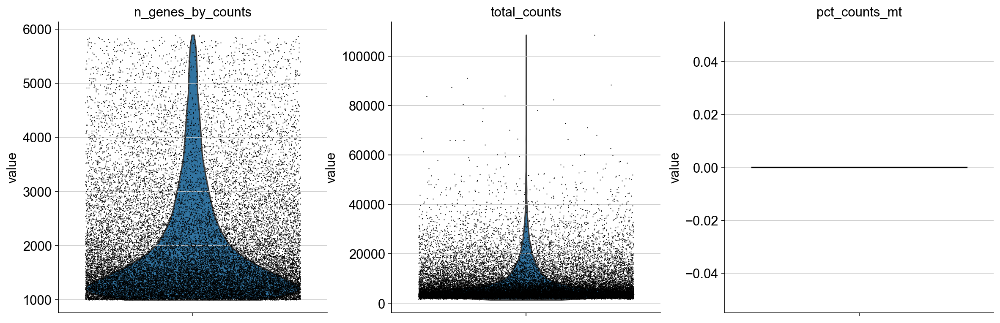

In [156]:
sc.pl.violin(cancer_data, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

In [61]:
cancer_data = cancer_data[cancer_data.obs.n_genes_by_counts < 40000, :]
cancer_data = cancer_data[cancer_data.obs.n_genes_by_counts > 500, :]
cancer_data = cancer_data[cancer_data.obs.total_counts > 800, :]
cancer_data = cancer_data[cancer_data.obs.pct_counts_mt < 20, :]
cancer_data

View of AnnData object with n_obs × n_vars = 27262 × 19039
    obs: 'cellID', 'sampleID', 'histology', 'method', 'sex', 'age', 'smoking_status', 'disease', 'dataset', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [62]:
cancer_data_counts = cancer_data
cancer_data_counts

View of AnnData object with n_obs × n_vars = 27262 × 19039
    obs: 'cellID', 'sampleID', 'histology', 'method', 'sex', 'age', 'smoking_status', 'disease', 'dataset', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [158]:
# Clustering
cancer_data.layers["counts"] = cancer_data.X.copy()
sc.pp.normalize_total(cancer_data, target_sum = 1e4)
sc.pp.log1p(cancer_data)
sc.pp.highly_variable_genes(cancer_data, min_mean = 0.0125, max_mean = 3, min_disp = 0.5, n_top_genes = 1000)
cancer_data.raw = cancer_data
cancer_data = cancer_data[:, cancer_data.var.highly_variable]
cancer_data

normalizing counts per cell
    finished (0:00:00)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:07)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


View of AnnData object with n_obs × n_vars = 27262 × 1000
    obs: 'cellID', 'sampleID', 'histology', 'method', 'sex', 'age', 'smoking_status', 'disease', 'dataset', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
    layers: 'counts'

In [159]:
sc.pp.scale(cancer_data, max_value = 10)
sc.tl.pca(cancer_data, svd_solver = 'arpack')
sc.pp.neighbors(cancer_data, n_neighbors = 15, n_pcs = 40)

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)


In [160]:
import bbknn
bbknn.bbknn(cancer_data, batch_key = "sampleID", n_pcs = 40)

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)


In [161]:
sc.tl.umap(cancer_data)
sc.tl.leiden(cancer_data, resolution = 0.3)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:24)
running Leiden clustering
    finished: found 15 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:18)


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


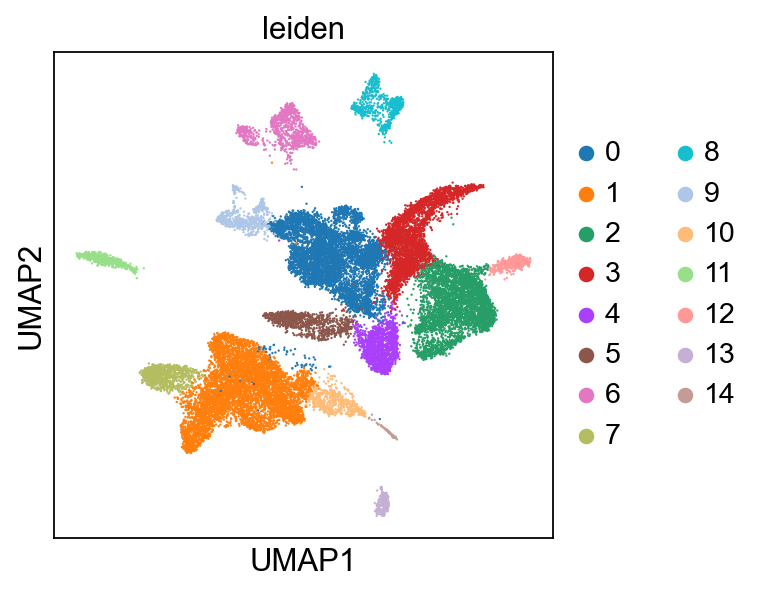

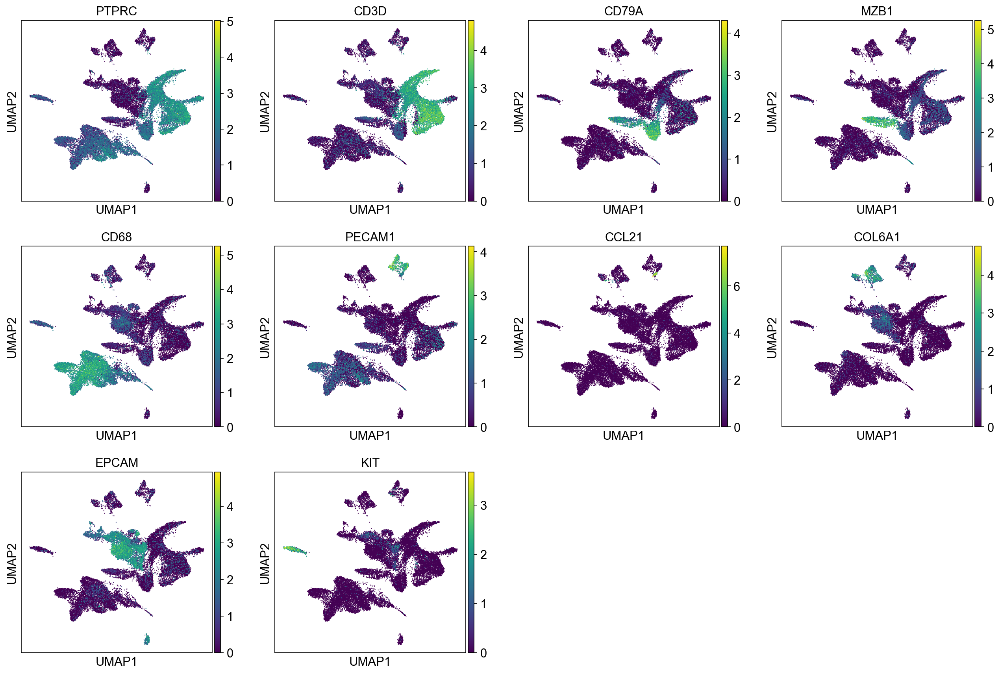

In [162]:
sc.pl.umap(cancer_data, color = "leiden")
sc.pl.umap(cancer_data, color = ["PTPRC", "CD3D", "CD79A", "MZB1", "CD68",
                               "PECAM1", "CCL21", "COL6A1", "EPCAM", "KIT"])

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


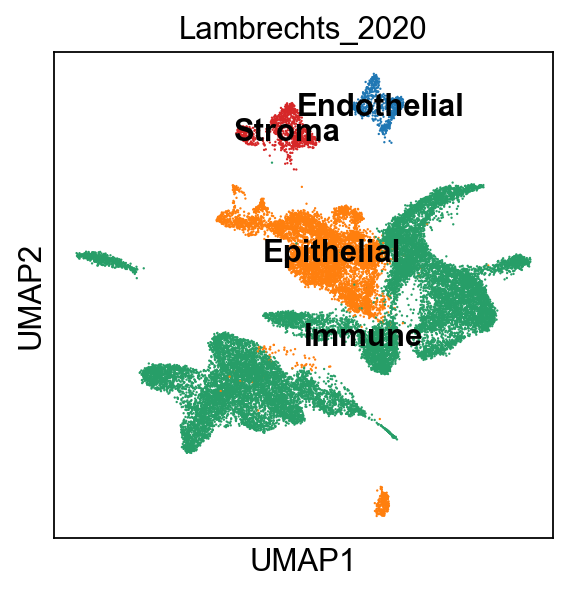

In [164]:
new_cluster_names = {
    "0": "Epithelial",
    "1": "Immune",
    "2": "Immune",
    "3": "Immune",
    "4": "Immune",
    "5": "Immune",
    "6": "Stroma",
    "7": "Immune",
    "8": "Endothelial",
    "9": "Epithelial",
    "10": "Immune",
    "11": "Immune",
    "12": "Immune",
    "13": "Epithelial", 
    "14": "Immune", 
}
cancer_data.obs["major_cell_type"] = [new_cluster_names[i] for i in cancer_data.obs["leiden"].tolist()]
sc.pl.umap(cancer_data, color = ["major_cell_type"], legend_loc = "on data", title = "Lambrechts_2020")

In [165]:
cancer_data.write_h5ad("1.ProcessedData/cancer_Lambrechts_2020.h5ad")
cancer_data

AnnData object with n_obs × n_vars = 27262 × 1000
    obs: 'cellID', 'sampleID', 'histology', 'method', 'sex', 'age', 'smoking_status', 'disease', 'dataset', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'major_cell_type'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'major_cell_type_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [64]:
cancer_data_counts.obs = cancer_data.obs
cancer_data_counts

AnnData object with n_obs × n_vars = 27262 × 19039
    obs: 'cellID', 'sampleID', 'histology', 'method', 'sex', 'age', 'smoking_status', 'disease', 'dataset', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'major_cell_type'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [65]:
cancer_data_counts.write_h5ad("1.ProcessedData/cancer_Lambrechts_2020_counts.h5ad")
cancer_data_counts

AnnData object with n_obs × n_vars = 27262 × 19039
    obs: 'cellID', 'sampleID', 'histology', 'method', 'sex', 'age', 'smoking_status', 'disease', 'dataset', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'major_cell_type'
    var: 'mt', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'